In [1]:
# This is the example code link:
# https://algotrading101.com/learn/reddit-wallstreetbets-web-scraping/

# Log Jun. 8: like $CLOV, what about first time mention or threshold frequency?

# Log Jul. 2: ameliorated get_comments() to deal with request.json() method returning blank. Compiled gen_ticker_df 
    # function to generate dataframe from one single discussion thread.
    
# Log Jul. 3: reducing .json() access size from 1000 to 500 seems to solve the blank page problem. 
    # It's likely that time.sleep() doesn't solve the problem. More testing required. 
    # Tested on January threads (good GME age). 
    # Evening log: This is very good. The data collection process is running. I am very satisfied with today's progress. 
    # Update: holy fuck connection got cut. 
    # ('Connection aborted.', ConnectionResetError(10054, 'An existing connection was forcibly closed by the remote host', None, 10054, None))
    # This is easy to solve. Access 'raw' directory, generate date_str of obtained data. 
    # Build list. If new date_str not in list, continue to run code. 
    
# Log Jul. 4: Write script such that function runs only on uncollected dates. If error raised, wait for 10 minutes and run. 
    # The force_collect() function is a success, bypassing reddit limitation. 
    # Now, design function to grab time series data from collected raw data. 
    # Finished time series function. On a side note, I DON'T tihnk it's a good idea to use SARIMA on these data. 
    # The next step, we aim to retrieve the functions that grab stock data. 
    # Want to do a correlation study on the price, volume, and relative indices. 
    
# Log Jul. 6: obtained libraries to pull stock data. 
    # Visualization indicates a close relation between normalized stock volume and normalized WSB count. 
    # Next step: comparison study between mov and dis types. 
    # Also want to do time series regression on count. 
    # Linear regression still needs some precessing and work. Unit root problem, lags, etc. 
    
# Log Jul. 7: don't know what I did. 
    # Thought about comparison study a bit more, and decided to drop it: should the comparison study work, 
    # people would have already traded on it. There shouldn't be any correlation. 
    # Next step: generate returns maybe. If there exist characteristic relation between returns and raw data,
    # that would still be a good discovery. 
    # 09pm: tried some moving average indicators but don't seem to work very well. 
    
# Log Jul. 8: Failed to construct a backtester--maybe it's better to come up with strategy first then backtest. 
    # Realized that what got experimented is hypothesis as follows: 
    # H: does there exist a spike of sentiment (counts) above the long moving average that indicate return spike? 
    # This is observed in case of CLOV and AMC, maybe also in CLNE. 
    # Want to investigate this phenomenon further. 
    # Next step: write an actual strategy first, and test the strategy. 
    
# Log Jul. 9: Constrcted first strategy: "MOV" moving average threshold strategy. Wrote backtesting tool. 
    # Happy about today's progress. 
    # Can work more on the strategy. 
    # AMC has crazy profit when using this strategy with appropriate window. 
    # Next step: write loops and optimization functions for this strategy. 
    # Also, notice that at some point in the near future, need to either update raw data or get more data. 
    # Made a mistake in order numbers. Actually not that good but it's a good start. 
    
# Log Jul. 10: Slightly modified "MOV" moving average threshold strategy to Count Bollinger. 
    # Tested on multiple WSB stocks, and obtained sustained huge gain. 
    # To make sure there's no mistake, please look into this later. 
    # Optimization also needed, but complete the function and visualization first. 
    # Final note today: discovered that the algorithm is doing a lot of shorting. May need to modify the 
    # accounting method such that final balance is calculated right. 
    
    # Fixed accounting method, and some of them are still making visible profit. 
    # Noticed that the portfolio value usually decreases significantly after a spike. Need to figure out how to 
    # Preserve the profit. 
    
# Log Jul. 11: Fixed accounting method such that portfolio value is now correct. 
    # Now, need to make sure that the Bollinger band doesn't include today. 
    # A suggestion: maybe try to preserve the huge spike in mentioning? 
    # Suppose if the count passes 5 standard deviations away, shouldn't the spike be treated different? 
    # We should do optimization tomorrow. Really need to make sure no overfitting is present. 
    
# Log Jul. 14:
    # Note that the spike proposition is essentially having different Bollinger bands at the same time. 
    # It is worth to do optimization first. 
    # Also need to parse the earlier information (learn how to click links.)
    # Noticed a decaying trend in order spikes, due to the setup method of order numbers. 
    # Maybe need to setup a global lower threshold such that "0,0,0, 0.002, 0,0,0.1" doesn't get picked up
    # Parsed information in 2021 January, and also wrote down a better function such that more information 
    # can be downloaded more easily. 
    # Started writing down the Sigmoid transformation idea. Need much more work into this. 
    # Reflected on the strategy, might have made a huge mistake in strategy (Bollinger). Check tomorrow. 
    # Count up implies more momentum right? 
    
# Log Jul. 15: 
    # Sigmoid needs more work. 
    # Fixed the order direction: when count reaches the upper band, should long instead of short. 
    # Note that we need to do something about the Bollinger band on Count: 
    # It makes no sense that the lower bound is negative--then shorting is entirely prevented 
    # since Count is lower bounded. 
    # Natural log transformation? 
    
# Log Jul. 16:
    # Short on the basis of Value instead of Cash? 

# Log Jul. 17: 
    # With sufficiently large short tolerance and long tolerance, the Benchmark line crosses the Value line. 
    # The following setting obtains a higher performance than Benchmark. See picture. 
    # main_StratCountSigmoid(ticker = 'PLTR',
    #                     start = '2021-01-1',
    #                     end = '2021-07-13',
    #                  window = 5,
    #                  std_scalar = 2,
    #                 short_risk_scalar = 1,
    #                  budget = 10000,
    #                         long_tol = 1,
    #                         short_tol = 0.8
    #                         )
    # And this setting: 
    # main_StratCountSigmoid(ticker = 'GME',
    #                     start = '2021-01-1',
    #                     end = '2021-07-13',
    #                  window = 5,
    #                  std_scalar = 1,
    #                 short_risk_scalar = 1,
    #                  budget = 10000,
    #                         long_tol = 1,
    #                         short_tol = 1
    #                         )
    # Did some cool visualization with heatmaps on sharpe ratio. 
    # Need to standardize the scales and render again. It seems like a window of 5 is the best choice. 
    
# Log Jul. 18
    # Before going to bed tonight, run script to generate Sharpe heatmaps with standardized colormap scale. 
    # What is to be done next? 
    # The MA t-Sigmoid strategy is written and evaluated via optimization on str and short ratio. 
    # Maybe long-short tolerance also needs optimization. 
    # That really is about all the parameters inlucded in the strategies written by now. 
    
# Log. Jul. 19
    # Called Tzuo, exchanged ideas on the research. 
    # Focusing on trading strategy and presentation. Try to write something down. 
    # Next step: ISCV. Cross-validation is very important. t-sigmoid strategy works fine, don't change anything. 
    # Side note: revise resume soon? 
    # Important result: parameter optimization depends heavily on the period. Try K-fold split and parameter optimization. 
    # Tzuo: "there's no best way to evaluate a portfolio--it heavily depends on the investor." 
    # Drawdown measure should be added. 

# Log. Jul. 20 
    # Multiple experiments have verified that the parameters are extremely PERIOD-DEPENDENT, STOCK-DEPENDENT
    # Start work on cross-validating. 
    # Plan: For everyday, W days of data is used to form decision rule for today. 
    # Can use N groups of (W days of information + 1 day of action) to test parameters. 
    
    # Meditation notes:
    # Q1: What's the training period? 
    # Result: need warming up period of (W+N) days, and use information from (n+1)~(n+w)th days, trade on (n+w+1)th day. 
    
    # Q2: How to evaluate the result? 
    # Result: for every n groups of (w+1), yield a set of parameters. 
    # Using the set of parameters on n+w+1 th day, obtain a certain measure (MDD, Sharpe, Sortino). 
    # Collect measure data, obtain a list of U-N-W trade measures. 
    
    # Q3: How to choose a set of parameters? 
    # Result: Holding sigmoid transformation constant, there exist 6 parameters: 
        # W -- information window size
        # std_scalar -- scalar on std 
        # short_risk_scalar -- the scalar on downward risk
        # long_tol -- Portfolio proportion tolerance for long orders
        # short_tol -- Portfolio proportion tolerance for short orders
        # (META) N -- training period size. 
    # Maximum may not be the best measure due to randomness. Want structural relations. 
    # Will run a experiment on best of 10 sharpes. 
    # Important question: it's almost impossible to do a 5-param optimization. Does std-short ordinal relation 
    # conserve when changing long-short tolerance? 
        # Answer: experiment on GME 3.1-4.20 shows that changing long-short tolerance does not change 
        # ordinal relationship in choosing the BEST parameters. 
        # This indicates that the optimization for two set of parammeters can be separately done. 
        
    # Evening update: Sketched Cross-validation function. Finished optimization part. 
    # Quite happy about the result of opt function. 
    
# Log. Jul. 21
    # W, N are important meta-parameters too. How should we decide it?
    # Note that while parameters in param dictionary are period specific, 
    # W is deteremine BEFORE generation of parameter dictionary, as it determines the structure of 
    # optimization algorithm design. 
    # Just from intuition, the only fishy part in the algorithm is that 
    # gen_order and backtest are DIRECTLY employed in the training part. Check it. 
    # Also, in order editing part, remember that short_tol and long_tol should be from param_dict 
    # Some performances aren't that good -- is it possible to also consider the global long run MA and 
    # dramatic deviation from it? 
    # Also, another problem to consider: in training section, the (W+N) training window has warm up 
    # -- and thus empty -- periods. This is wasting information. 
    
# Log. Jul. 24
    # Fixing the indexing problem in training period--the length of warming up was unaccounted. Testing if it worked. 
    # Should modify the strategy such that global history out-of-band spikes be prioritized. 
    # Notice that usually, Bollinger band using global MA is a bit tricky, but in the case of Count, it's bounded below by 0.
    
# Log. Jul. 25
    # The problem with count sigmoid strategy is that, when count experiences huge variance, the lower bound becomes negative. 
    # And even if short ratio is applied, the sigmoid below zero always leads to shorting. 
    # Extending the scope of parameter search for long-short tolerance to negative numbers, but don't think it will fix it. 
    # It's worth trying logarithm transformation of count too. [0,inf] -> [-inf, inf]
    # Another thought: until now, Sharpe ratio is the only metric used to evaluate portfolio. 
    # Should add sortino ratio into backtest_ function as an option argument. 
    # To do:
        # 1. Add sortino ratio. (MDD too, maybe.) (DONE)
            # While thinking about parameter optimization, realized that the r-outcome of training period has lower variance. 
            # This lower variance would prevent us from optimization. Want to change this. IMPORTANT. 
            # FIXME
            
        # 2. Think about ".mode.median()". Maybe using established pairs. 
            # Thought about this, this is not the main problem. See above. 
            # SOLVED 
            
        # 3. Design ln(Count) transformation method. 
            # Thoughts: easiest solution to lower bound problem: make lower bound 0. Can easily try. 
            # Checked backtest data from 1.1-4.1 GME W4N5. Apparently a lot of C_L are below 0. 
            # Resulting in the impossiblity of the shorting decision. 
            # FIXME
            
        # 4. Fix benchmark. (should be an indexing error)
            # FIXED
            
# Log. Jul. 26
    # Added option in optimizaiton function where all 4 parameters are maximized at once. 
    # Obviously this is a very bad algorithm--however precise. 
    # One experiment on GME 1.1-4.1 yields result that BEATS BENCHMARK, structurally. 
    # Experimenting more. It's worth noting that the optimization function in a lot of cases chose negative short_tol. 
    # which, in fact, solves the negative lower threshold problem. See data created on Jul. 26. 
    
# Log. Jul. 27
    # Should really think about ln(Count) strategy. Realized this when experimenting on MVIS, which has virtually no counts
    # in January. This results in upper threshold below 5. 
    # Thoughts: if Count = 0, then ln(Count) = -inf. Then Count_MA for any window would establish a sum of -inf, and Count_MA of -inf. 
    # What will the Count_Upper and Count_Lower be? Also -inf. 
    # Count is a natural number, which implies that ln(Count) is never negative. 
    # Had a big realization--Count ~ Poi(MA(C,W)). Checked first and second moments, the difference is approximately normal. 
    # Devised Poisson Strategy, and wrote gen_order and backtest. Writing optimization and CV functions tomorow. 
    # Finished optimization function and CV function. Lots of bugs and performance issues. Fixing tomorrow. 
    
# Log. Jul. 28
    # Debugged the entirety of Poisson strategy. Running more tests tomorrow. 
    # Intuition: this new strategy may tend to overshort (or, that the parameter searching prevents it to some extent)
    # If so, might need to add in stop-loss liquidation sequence to solidify the gain. 
    # The strategy performs well in multiple experiments, but risk control needs to be implemented. 
    # Ideas: stop-loss risk control, global moving average thresholds. 
    # Controlling for sigmoid multiplier does not change the structural drop/spikes in portfolio history. 
    # Which further tells us that risk control needs to be implemented. 

# Log. Jul. 29
    # Look into logistic distribution to see whether it's a better replacement for Poisson. 
    
# Log. Jul. 30
    # Jul. 31 2am. Leverage ratio 2 test. Write risk control tomorrow. 
    # Risk control need to be implemented to both the backtest function and te CV function. 
    # Cannot think of anything else than keep tabs on global MA and std, or using stop-loss order to control loss. 
    # Thoughts: 
        # gen_order uses first order decision rules, according to distribution, to determine WHETHER TO LONG OR SHORT
            # e.g. Long when by Poisson Prob(Count>MA) < 0.05
        # backtest uses second order decision rules, to determine HOW MUCH TO LONG/SHORT
            # e.g. long_tol * Cash * Count_Sigmoid
            
# Log. Jul. 31
    # Thoughts: how do we use global MA and std to regulate risk? 
    # At day = t, we obtain 
        # global_MA = df.loc[:t,'Count'].mean()
        # global_STD = df.loc[:t,'Count'].std()
    # With increasing sample, the variance in theory is decreasing. 
    # Assume that these statistics contain information at all, as t increases, the probability drifting away 
    # from MA should be lower and lower. 
    # (This may only be applied to the long side) If Count surpasses global MA by global STD, it could be 
    # a bullish indicator, even if the first order decision rule doesn't imply bullish trend
    # (Which also means that this needs to be written into gen_order)
    #
    # First version of risk control (leverage ratio) has good result on GME. 
    # Gives us the thought to write a ticker selection function. (This is very easy using get_ticker_ts function)
    # because apparently, if the ticker is not very popular in time, the strategy will not perform well. 
    # further experiment shows that apparently SHORT LIQUIDATION is required. (2*budget loss in one day.) 

In [1]:
%%javascript

window.scroll_flag = true
window.scroll_exit = false
window.scroll_delay = 100

$(".output_scroll").each(function() {
    $(this)[0].scrollTop = $(this)[0].scrollHeight;
});

function callScrollToBottom() {
    setTimeout(scrollToBottom, window.scroll_delay);
}

function scrollToBottom() {
    if (window.scroll_exit) {
        return;
    }
    if (!window.scroll_flag) {
        callScrollToBottom();
        return;
    };
    
    $(".output_scroll").each(function() {
        if (!$(this).attr('scroll_checkbox')){
            window.scroll_flag = true;
            $(this).attr('scroll_checkbox',true);
            var div = document.createElement('div');
            var checkbox = document.createElement('input');
            checkbox.type = "checkbox";
            checkbox.onclick = function(){window.scroll_flag = checkbox.checked}
            checkbox.checked = "checked"
            div.append("Auto-Scroll-To-Bottom: ");
            div.append(checkbox);
            $(this).parent().before(div);
        }
        
        $(this)[0].scrollTop = $(this)[0].scrollHeight;
    });
    callScrollToBottom();
}
scrollToBottom();

<IPython.core.display.Javascript object>

In [2]:
from selenium import webdriver
from selenium.common.exceptions import TimeoutException
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
from collections import Counter
import numpy as np
from datetime import date, timedelta
from dateutil.parser import parse 
import requests
import os

def grab_html():
    url = 'https://www.reddit.com/r/wallstreetbets/search/?q=flair%3A%22Daily%20Discussion%22&restrict_sr=1&sort=new'
    driver = webdriver.Chrome(executable_path=r'C:\Users\linru\Desktop\Research\chromedriver.exe')
    driver.get(url)
    timeout = 5 
    try:
        element_present = EC.presence_of_element_located((By.ID, 'element_id'))
        WebDriverWait(driver, timeout).until(element_present)
    except TimeoutException:
        print("Timed out waiting for page to load")
    return driver

def grab_link(driver):
    from datetime import date, timedelta
    from dateutil.parser import parse
    yesterday = date.today() - timedelta(days=1)
    links = driver.find_elements_by_xpath('//*[@class="_eYtD2XCVieq6emjKBH3m"]') 
    print(links)
    for a in links:
#         if a.text.startswith('Daily Discussion Thread'):
#             date = "".join(a.text.split(' ')[-3:])
#             parsed = parse(date) 
#             if parse(str(yesterday)) == parsed:
#                 link = a.find_element_by_xpath('../..').get_attribute('href')
#         elif a.text.startswith('Weekend'):
#             weekend_date = a.text.split(' ') 
#             parsed_date = weekend_date[-3] + ' ' + \
#                 weekend_date[-2].split("-")[1] + \
#                 weekend_date[-1] 
#             parsed = parse(parsed_date) 
#             saturday = weekend_date[-3] + ' ' +   \
#             str(int(weekend_date[-2].split('-')[1].replace(',','')) - 1) + ' ' + weekend_date[-1] 
# #         elif 'Moves' in a.text:
# #             date = "".join(a.text.split(' ')[-3:])
# #             parsed = parse(date) 
            
# #         else:
# #             print('nope')
# #             parsed = 0
#             if parse(str(yesterday)) == parsed: # FIXME
#                 link = a.find_element_by_xpath('../..').get_attribute('href')
#             elif parse(str(yesterday)) == parse(str(saturday)):
#                 link = a.find_element_by_xpath('../..').get_attribute('href') 
            
        print(a.text)
    stock_link = link.split('/')[-3]
    driver.close() 
    return stock_link

# Log Jun. 9: Note that the example code only focuses on yesterday, and obtain information solely for yesterday. 
# If we were to conduct static/econometric research on this information, we need all previous discussion threads. 

def grab_commentid_list(stock_link):
    html = requests.get(f'https://api.pushshift.io/reddit/submission/comment_ids/{stock_link}')
    raw_comment_list = html.json()
    return raw_comment_list

def grab_stocklist():
    with open('stockslist.txt', 'r') as w:
        stocks = w.readlines()
        stocks_list = []
        for a in stocks:
            a = a.replace('\n','')
            stocks_list.append(a)
    return stocks_list 

def get_comments(comment_list):
    html = requests.get(f'https://api.pushshift.io/reddit/comment/search?ids={comment_list}&fields=body&size=1000')
    newcomments = html.json()
    return newcomments

def get_stock_list(newcomments,stocks_list):
    stock_dict = Counter()
    for a in newcomments['data']:
        for ticker in stocks_list:
            if ticker in a['body']:
                stock_dict[ticker]+=1
    return stock_dict

def grab_stock_count(stock_dict,raw_comment_list):
    orig_list = np.array(raw_comment_list['data'])
    comment_list = ",".join(orig_list[0:1000])
    remove_me = slice(0,1000)
    cleaned = np.delete(orig_list, remove_me)
    i = 0
    while i < len(cleaned):
        print(len(cleaned))
        cleaned = np.delete(cleaned, remove_me)
        new_comments_list = ",".join(cleaned[0:1000])
        newcomments = get_comments(new_comments_list)
        get_stock_list(newcomments,stocks_list)
    stock = dict(stock_dict) 
    return stock

# if __name__ == "__main__":
#     driver = grab_html()
#     stock_link = grab_link(driver)
#     raw_comment_list = grab_commentid_list(stock_link) 
#     stockslist = grab_stocklist()
#     print(stockslist)
#     newcomments = get_comments(comment_list)
#     stock_dict = get_stock_list(new_comments,stocks_list)
#     stock = grab_stock_count(stock_dict)

In [ ]:
# MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE 
# MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE 
# MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE 
# MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE 
# MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE MAIN DEPOSITORY HERE 

# PHASE 1 : STATIC RESEARCH
# Algo 0.1 design: 
# 1.0 Use chromedriver to access Reddit WSB search engine. 
# 1.1 Figure out how to scroll all the way down to load all threads. 
# 2.0 Get link from EVERY "Daily Discussion Threads". Store them. 
# 3.0 For each discussion threads, scrap comments. Store comments. 
# 4.0 Analyzing comments. Store result separately for each discussion thread. 
# 5.0 Combine discussion thread analysis to obtain total file. 

# driver = grab_html()
# stock_link = grab_link(driver)
# raw_comment_list = grab_commentid_list(stock_link) 
# stockslist = grab_stocklist()
# newcomments = get_comments(comment_list)
# stock_dict = get_stock_list(new_comments,stocks_list)
# stock = grab_stock_count(stock_dict)

from selenium import webdriver
from selenium.common.exceptions import TimeoutException
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
from collections import Counter
import numpy as np
from datetime import date, timedelta
from dateutil.parser import parse 
import requests
import time
import re
import sys
import seaborn as sns
import pandas as pd
import os
import datetime
from pandas_datareader import data
import yfinance as yf
from yahoofinancials import YahooFinancials
import matplotlib.pyplot as plt
import seaborn as sns
from dateutil import parser
from scipy.stats import poisson

def grab_html_1():
    path = os.getcwd().replace('code','raw')
    url = 'https://www.reddit.com/r/wallstreetbets/search/?q=flair%3A%22Daily%20Discussion%22&restrict_sr=1&sort=new'
#     driver = webdriver.Chrome(executable_path=r'C:\Users\linru\Desktop\Research\chromedriver.exe')
    driver = webdriver.Chrome(executable_path='\\'.join([path, 'chromedriver.exe']))
    driver.get(url)
#     timeout = 5 
    SCROLL_PAUSE_TIME = 2
    last_height = driver.execute_script("return document.body.scrollHeight")
    while True:
        # Scroll down to bottom
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")

        # Wait to load page
        time.sleep(SCROLL_PAUSE_TIME)

        # Calculate new scroll height and compare with last scroll height
        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            break
        last_height = new_height
#     try:
#         element_present = EC.presence_of_element_located((By.ID, 'element_id'))
#         WebDriverWait(driver, timeout).until(element_present)
#     except TimeoutException:
#         print("Timed out waiting for page to load")
    return driver

# grab_html_2  grabs additional data, can input any search question 

def grab_html_2(search, sort = 'new'):
    path = os.getcwd().replace('code','raw')
    q = '%20'.join(search.split())
    url = 'https://www.reddit.com/r/wallstreetbets/search/?q=flair%3A%22Daily%20Discussion%22' + \
            q + '&restrict_sr=1&sort=new'

    driver = webdriver.Chrome(executable_path='\\'.join([path, 'chromedriver.exe']))
    driver.get(url)
#     timeout = 5 
    SCROLL_PAUSE_TIME = 2
    last_height = driver.execute_script("return document.body.scrollHeight")
    while True:
        # Scroll down to bottom
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")

        # Wait to load page
        time.sleep(SCROLL_PAUSE_TIME)

        # Calculate new scroll height and compare with last scroll height
        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            break
        last_height = new_height
#     try:
#         element_present = EC.presence_of_element_located((By.ID, 'element_id'))
#         WebDriverWait(driver, timeout).until(element_present)
#     except TimeoutException:
#         print("Timed out waiting for page to load")
    return driver

def WSB_thread_process(th,delim):
    output = th
    for d in str(delim):
        if d in th:
            output = ''.join(output.split(d)[:-1])
    return output.strip() 


# WSB_thread_process(t,'-:')    
    
def grab_link_1(driver):
    from datetime import date, timedelta
    from dateutil.parser import parse
    yesterday = date.today() - timedelta(days=1)
    links = driver.find_elements_by_xpath('//*[@class="_eYtD2XCVieq6emjKBH3m"]') 
    link_dict_d, link_dict_m = {},{}
    for a in links:
        atext = a.get_attribute('textContent').lower()
        atext = WSB_thread_process(atext,':-')
        print(atext)
        # There exist three types of links: "Daily Discussion" and "Moves Tomorrow"
        if 'daily discussion' in atext:
            date = parse("".join(atext.split(' ')[-3:]))
            link = a.find_element_by_xpath('../..').get_attribute('href')
            link_dict_d[date] = link.split('/')[-3]
            
        elif 'moves' in atext:
            date = parse("".join(atext.split(' ')[-3:]))
            link = a.find_element_by_xpath('../..').get_attribute('href')
            link_dict_m[date] = link.split('/')[-3]
            
#         if a.text.startswith('Daily Discussion Thread'):
#             date = "".join(a.text.split(' ')[-3:])
#             parsed = parse(date) 
#             if parse(str(yesterday)) == parsed:
#                 link = a.find_element_by_xpath('../..').get_attribute('href')
#         elif a.text.startswith('Weekend'):
#             weekend_date = a.text.split(' ') 
#             parsed_date = weekend_date[-3] + ' ' + \
#                 weekend_date[-2].split("-")[1] + \
#                 weekend_date[-1] 
#             parsed = parse(parsed_date) 
#             saturday = weekend_date[-3] + ' ' +   \
#             str(int(weekend_date[-2].split('-')[1].replace(',','')) - 1) + ' ' + weekend_date[-1] 
# #         elif 'Moves' in a.text:
# #             date = "".join(a.text.split(' ')[-3:])
# #             parsed = parse(date) 
            
# #         else:
# #             print('nope')
# #             parsed = 0
#             if parse(str(yesterday)) == parsed: # FIXME
#                 link = a.find_element_by_xpath('../..').get_attribute('href')
#             elif parse(str(yesterday)) == parse(str(saturday)):
#                 link = a.find_element_by_xpath('../..').get_attribute('href') 
            
#         print(a.text)
#     stock_link = link.split('/')[-3]
    driver.close() 
    return link_dict_d, link_dict_m

def remove_emoji(string):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002500-\U00002BEF"  # chinese char
                               u"\U00002702-\U000027B0"
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               u"\U0001f926-\U0001f937"
                               u"\U00010000-\U0010ffff"
                               u"\u2640-\u2642"
                               u"\u2600-\u2B55"
                               u"\u200d"
                               u"\u23cf"
                               u"\u23e9"
                               u"\u231a"
                               u"\ufe0f"  # dingbats
                               u"\u3030"
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)

def remove_link(t):
    tok_list = t.split()
    for i in range(len(tok_list)):
        if 'http' in tok_list[i]:
            tok_list[i] = ''
    out = ' '.join(tok_list)
        
    return out

def comment_process(t):
    # remove emojis
    out = remove_emoji(t)
    
    # remove [] contents
    out = re.sub("[\[].*?[\]]", "", out)
    
    # link recognition and removal 
    out = remove_link(out)
    
    # hard-coding removal
    out.replace('\n',' ')
    unwanted = ['!','?','.']
    for u in unwanted:
        out.replace(u,'')

    # should we drop questions? "Is XXX a buy? "
    # WRITE ME
    
    # More processing added here
    
    return out

# At this step, obtain individual comment_id's. 
# For every comment_id, need to do:
# 1. Grab comment_list. 
# 2. Process individual comments. 
# 3. grab tickers, obtain counts. 
# 4. Do this for all comments. 

def grab_commentid_list(stock_link):
    html = requests.get(f'https://api.pushshift.io/reddit/submission/comment_ids/{stock_link}')
    raw_comment_list = html.json()
    return raw_comment_list

def get_comments_0(comment_list):
    html = requests.get(f'https://api.pushshift.io/reddit/comment/search?ids={comment_list}&fields=body&size=1000')
    # modification jun. 30 : when getting html, wait for 0.5 secs? 
    newcomments = None
    timeout = 20
    timesleep = 0.5
    while newcomments is None and timeout > 0: 
        try: 
            newcomments = html.json()
        except:
            time.sleep(timesleep)
            timesleep += 0.5
            timeout -= 1
            pass 
    return newcomments 

def get_comments_1(comment_list):
    html = requests.get(f'https://api.pushshift.io/reddit/comment/search?ids={comment_list}&fields=body&size=500')
    # modification jun. 30 : when getting html, wait for 0.5 secs? 
    newcomments = None
    timeout = 30
    timesleep = 0.5
    while newcomments is None and timeout > 0: 
        try: 
            newcomments = html.json()
        except:
            time.sleep(timesleep)
            timesleep += 0.5
            timeout -= 1
            pass 
    return newcomments 

def grab_stocklist():
    path = os.getcwd().replace('code','raw')
    with open('\\'.join([path,'stockslist.txt']), 'r') as w:
        stocks = w.readlines()
        stocks_list = []
        for a in stocks:
            a = a.replace('\n',' ').strip()
            stocks_list.append(a)
    return stocks_list 

def get_stock_list_00(newcomments,stocks_list,stock_dict):
    for a in newcomments['data']:
        for ticker in stocks_list:
            if ticker in a['body']:
                stock_dict[ticker]+=1
    return stock_dict

def get_stock_list_01(newcomments,stocks_list, stock_dict):
#     stock_dict = Counter()
    for a in newcomments['data']:
        for ticker in stocks_list:
            comment_str = a['body'].lower()
            cleaned = comment_str
            if ticker.lower() in cleaned:
                stock_dict[ticker]+=1
    return stock_dict

def get_stock_list_11(newcomments,stocks_list, stock_dict):
#     stock_dict = Counter()
    # a['body'] is the comment string. Process it here. 
    for a in newcomments['data']:
        for ticker in stocks_list:
            comment_str = a['body'].lower()
            cleaned = comment_process(comment_str).strip()+' '
            if ticker.lower()+' ' in cleaned:
                stock_dict[ticker]+=1
    return stock_dict

def gen_ticker_df(thread_link, ticker_length):
    no_data = True
    raw_comment_list = grab_commentid_list(thread_link)
    stocks_list = grab_stocklist()
    orig_list = np.array(raw_comment_list['data'])
    remove_me = slice(0,500)
    cleaned = np.delete(orig_list, remove_me)
    stock_dict = Counter()
    while 0 < len(cleaned):
        print(len(cleaned))
        cleaned = np.delete(cleaned, remove_me)
        print(1)
        new_comments_list = ",".join(cleaned[0:500])
        print(2)
        newcomments = get_comments_1(new_comments_list)
        print(3)
        stock_dict = get_stock_list_00(newcomments,stocks_list, stock_dict)
        print(4)
    stock = dict(stock_dict)
    stockdf = pd.DataFrame({'Tickers':stock.keys(),'Count':stock.values()})
    ticker_len_filt = stockdf.loc[:,'Tickers'].apply(lambda x: len(x)>=ticker_length)
    stock_df = stockdf[ticker_len_filt]
    
    if not stock_df.empty:
        stock_df = stock_df.sort_values(by = 'Count',ascending=False)
        no_data = False
    
    return stock_df, no_data

def collect():
    data_path = os.getcwd().replace('code','raw')+'\\collect\\mov2'
    filled_dates = [f.split('_')[0] for f in os.listdir(data_path) if '2021' in f]
    print('Checked directory.')
    print(filled_dates)
    for day in m.keys():
        date_str = '-'.join([str(day.year),str(day.month),str(day.day)])
        if date_str not in filled_dates: 
            thread_id = m[day]
            df, no_data = gen_ticker_df(thread_id, 2)

            if no_data == False: 
                filename = '_'.join([date_str,'mov',thread_id])+'.csv'
                df.to_csv('\\'.join([data_path,filename]))
            print('Date: ',date_str,'; ','Thread ID: ', thread_id, ' Done.',sep='')
            if no_data == True: 
                print('This one has empty data.')
    return

def force_collect():
    try:
        collect()
    except:
        time.sleep(600)
        collect()  
    return

def get_ticker_ts(ticker, kind = 'dis'):
    if kind == 'dis':
        path = '\\'.join([os.getcwd().replace('code','raw'),
                         'collect',
                         'dis'])
    elif kind == 'mov':
        path = '\\'.join([os.getcwd().replace('code','raw'),
                         'collect',
                         'mov'])        
    # build list of raw data.
    date_col = []
    count_col = []
    for filename in os.listdir(path): 
        if '.csv' in filename:
            date_str = filename.split('_')[0]
            file = pd.read_csv('\\'.join([path, filename]))
            file = file.loc[:,['Tickers','Count']]
            select_filt = (file.loc[:,'Tickers'] == ticker.upper())
            count = 0
            if len(file.loc[select_filt]) > 0: 
                count = file.loc[select_filt].loc[:,'Count'].to_numpy()[0]
            date_col.append(date_str)
            count_col.append(count)
    output = pd.DataFrame({'Time':date_col,'Count':count_col})
    
    return output

def build_stock_df(ticker, start, end):
    df = yf.download(ticker,
                    start = start,
                    end = end,
                    progress = False)

    # Keep only adjusted close and volume 
    df = df.loc[:,['Adj Close','Volume']]
    df.rename(columns = {'Adj Close':'Close'},inplace=True)

    # Reindex reddit data
    reddit_df = get_ticker_ts(ticker, kind = 'mov')
    reddit_df.loc[:,'Time'] = pd.to_datetime(reddit_df.loc[:,'Time'])
    reddit_df.rename(columns = {'Time':'Date'},inplace = True)

    # This line gives the composed df. 
    df = pd.merge(df.reset_index(), reddit_df, how = 'outer', on = 'Date').dropna(how = 'any').set_index('Date')   
    
    return df


# Write normalization function. 


def norm(df, how = 'prob'):
    if how == 'prob':
        out = (df-df.mean())/df.std()
    if how == 'mm':
        out = (df-df.min())/(df.max()-df.min())
    return out

# The rest are written strategies to use the raw information. 

def gen_Order_StratCountMA(df, window, streak, budget):
    df = df.reset_index()
    df.loc[:,'Count_MA'] = df.loc[:,'Count'].rolling(window).mean()
    
    # Maybe, make a count bollinger band strat? 
    
    df.loc[:,'Ind'] = [0] * len(df)
    Ind_filt = df.loc[:,'Count_MA']<df.loc[:,'Count']
    df.loc[Ind_filt,'Ind'] = 1
    df.loc[:,'Streak'] = [0] * len(df)
    df.loc[:,'Order'] = [0] * len(df)

    for i in range(len(df)):
        if df.loc[i,'Ind'] == 0:
            df.loc[i,'Streak'] = 0
        else:
            df.loc[i,'Streak'] = df.loc[i-1,'Streak'] + 1
            
    order_filt = (df.loc[:,'Streak'] >= streak)
    df.loc[order_filt,'Order'] = 1
    
    return df

def backtest_CountMA(df, budget): 
    # if order != 0 , want to put all portfolio into stock. 
    # in order to do this, need real time cash, and real time price. 
    
    # temporary order number: 
    # update order number: 
    # if the order number is 0 yesterday, Cash remains the same. 
    # if the order number is 1 yesterday, order number should adjust according to Cash yesterday. 
    
    df.loc[0,'Cash'] = budget
    
    for i in range(len(df)):
        if df.loc[i,'Order'] == 0:
            df.loc[i+1,'Cash'] = df.loc[i,'Cash']
        else:
            df.loc[i,'Order'] = df.loc[i-1,'Cash'] // df.loc[i,'Close']
            expense = (df.loc[i+1,'Close'] - df.loc[i,'Close']) * df.loc[i,'Order']
            df.loc[i+1,'Cash'] = expense + df.loc[i,'Cash']
    
    return df 

def main_StratCountMA(ticker, start, end, window, streak, budget):
    df = build_stock_df(ticker, start = start, end = end)
    df.loc[:,'returns'] = (df.loc[:,'Close'] - df.loc[:,'Close'].shift(1))/df.loc[:,'Close'] # gen returns 
    df = gen_Order_StratCountMA(df, window, streak, budget)
    df = backtest_CountMA(df, budget)

    # Visualization: 
    
    plt.figure(figsize = [12,6])
    sns.set_style('darkgrid') 
    norm_df = norm(df.loc[:,['Count','returns','Ind']], how = 'mm')
    g1 = sns.lineplot(data = norm_df, palette = 'magma')
    plt.show()
    
    plt.figure(figsize = [12,6])
    sns.set_style('darkgrid')
    df.set_index('Date')
    g2 = sns.lineplot(x = df.index, y = df.loc[:,'Cash'])
    plt.show() 
    
    r = (df.loc[len(df)-2,'Cash']-budget)/budget
    print('return in total is',
          r)
    
    return 

# if __name__ == "__main__":
search_list = ['January 2021']
for s in search_list:
    driver = grab_html_2(search = s)
# driver = grab_html_1()
    d,m = grab_link_1(driver)
    print(m)
    force_collect()
# # print(d)
# # print(m)
# # key = 'l7ept4'
# # df = gen_ticker_df(key,3)
# # print('The thread key is ',key,sep = '')
# # print('\n')
# # print(df.head(10))

# force_collect()

daily discussion thread for january 29, 2021
daily discussion thread for january 29, 2021
daily discussion thread for january 29, 2021
daily discussion thread part 7 for january 28, 2021
daily discussion thread part 6 for january 28, 2021
daily discussion thread part 5 for january 28, 2021
what are your moves tomorrow, january 29, 2021
daily discussion thread part 4 for january 28, 2021
daily discussion thread part 3 for january 28, 2021
daily discussion thread, part 2, for january 28, 2021
daily discussion thread for january 28, 2021
what are your moves tomorrow, january 28, 2021
daily discussion thread for january 27, 2021
daily discussion thread for january 27, 2021
what are your moves tomorrow, january 27, 2021
the gme thread part 2 for january 26, 2021
the gme thread part 1 for january 26, 2021
daily discussion thread for january 26, 2021
what are your moves tomorrow, january 26, 2021
daily discussion thread for january 25, 2021
what are your moves tomorrow, january 21, 2021
daily

In [5]:
# Investigation: write test strategy on monving average.  



def gen_Order_StratCountBollinger(df,budget, window = 5, std_scalar = 1, short_risk_scalar = 2):
    df = df.reset_index()
    df.loc[:,'Count_MA'] = df.loc[:,'Count'].shift(1).rolling(window).mean()
    df.loc[:,'Count_STD'] = df.loc[:,'Count'].shift(1).rolling(window).std()
    df.loc[:,'Count_normal'] = (df.loc[:,'Count'] - df.loc[:,'Count_MA'])/df.loc[:,'Count_STD']
    df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'] + df.loc[:,'Count_STD'] * short_risk_scalar * std_scalar
    df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'] - df.loc[:,'Count_STD'] * std_scalar
    
    # Maybe, make a count bollinger band strat? 
    
    df.loc[:,'Order'] = [0] * len(df)
    short_filt = df.loc[:,'Count_Upper']<df.loc[:,'Count']
    long_filt = df.loc[:,'Count_Lower']>df.loc[:,'Count']
    df.loc[short_filt,'Order'] = 1
    df.loc[long_filt, 'Order'] = -1
    
    return df

def gen_Order_StratCountBollinger_1(df,budget, window = 5, std_scalar = 1, short_risk_scalar = 2):
    df = df.reset_index()
    df.loc[:,'Count_MA'] = df.loc[:,'Count'].shift(1).rolling(window).mean()
    df.loc[:,'Count_STD'] = df.loc[:,'Count'].shift(1).rolling(window).std()
    df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'] + df.loc[:,'Count_STD'] * std_scalar
    df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'] - df.loc[:,'Count_STD'] * short_risk_scalar * std_scalar
    
    # Maybe, make a count bollinger band strat? 
    
    df.loc[:,'Order'] = [0] * len(df)
    up_filt = df.loc[:,'Count_Upper']<df.loc[:,'Count']
    down_filt = df.loc[:,'Count_Lower']>df.loc[:,'Count']
    df.loc[down_filt,'Order'] = -1
    df.loc[up_filt, 'Order'] = 1
    
    return df

def backtest_CountBollinger(df, budget, long_tol, short_tol): 
    
    df.loc[0,'Cash'] = budget
    
    for i in range(1,len(df)):
        if df.loc[i,'Order'] == 0:
#             df.loc[i+1,'Cash'] = df.loc[i,'Cash']
            df.loc[i,'Cash'] = df.loc[i-1,'Cash']
        elif df.loc[i,'Order'] == 1:
            df.loc[i,'Order'] = (df.loc[i-1,'Cash'] * long_tol) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
#             df.loc[i+1,'Cash'] = expense + df.loc[i,'Cash']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']

        elif df.loc[i,'Order'] == -1:
            df.loc[i,'Order'] = -(df.loc[i-1,'Cash'] * short_tol) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
#             df.loc[i+1,'Cash'] = expense + df.loc[i,'Cash']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
    
    return df 

def backtest_CountBollinger_0(df, budget, long_tol, short_tol): 
    
    df.loc[0,'Cash'] = budget
    
    for i in range(1,len(df)):
        if df.loc[i,'Order'] == 0:
#             df.loc[i+1,'Cash'] = df.loc[i,'Cash']
            df.loc[i,'Cash'] = df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
        elif df.loc[i,'Order'] == 1:
            df.loc[i,'Order'] = (df.loc[i-1,'Cash'] * long_tol) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
#             df.loc[i+1,'Cash'] = expense + df.loc[i,'Cash']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']

        elif df.loc[i,'Order'] == -1:
            df.loc[i,'Order'] = -(df.loc[i-1,'Cash'] * short_tol) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
#             df.loc[i+1,'Cash'] = expense + df.loc[i,'Cash']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
    
    return df 

def main_StratCountBollinger(ticker, start, end, window, std_scalar, short_risk_scalar, budget, long_tol, short_tol):
    df = build_stock_df(ticker, start = start, end = end)
    df.loc[:,'returns'] = (df.loc[:,'Close'] - df.loc[:,'Close'].shift(1))/df.loc[:,'Close'] # gen returns 
    df = gen_Order_StratCountBollinger(df, budget, window, std_scalar, short_risk_scalar)
    df = backtest_CountBollinger(df, budget, long_tol, short_tol)
    df = df.dropna(how = 'any', subset = ['Count'])
    df.loc[:,'Position'] = df.loc[:,'Order'].cumsum()
    df.loc[:,'Value'] = df.loc[:,'Position'] * df.loc[:,'Close'] + df.loc[:,'Cash']
    
    df.set_index('Date')
#     print(df.head(50))
    
    # Visualization: 
    
    plt.figure(figsize = [12,6])
    sns.set_style('darkgrid') 
    norm_df = norm(df.loc[:,['Count','returns','Order']], how = 'prob')
#     norm_df = norm(df.loc[:,['returns','Count_normal']], how = 'prob')
    g1 = sns.lineplot(data = norm_df, palette = 'magma')
    plt.show()
    
    plt.figure(figsize = [12,6])
    sns.set_style('darkgrid')
    
    g2 = sns.lineplot(x = df.index, y = df.loc[:,'Value'])
    plt.show() 
    
    r = (df.loc[len(df)-1,'Value']-budget)/budget
    print('return in total is',
          r)
    
    return df.loc[:,'Value']

# New strategy: Sigmoid transformed rolling-t.  

def sigmoid(x, func = '2/pi'):
    if func == '2/pi':
        return (2/np.pi)*np.arctan((np.pi/2)*(x))
    elif func == 'tanh':
        return np.tanh(x)
    elif func == 'abs':
        return x / (1+np.abs(x))

def gen_Order_StratCountSigmoid(df,budget, window = 5, std_scalar = 1, short_risk_scalar = 2):
    df = df.reset_index()
    df.loc[:,'Count_MA'] = df.loc[:,'Count'].shift(1).rolling(window).mean()
    df.loc[:,'Count_STD'] = df.loc[:,'Count'].shift(1).rolling(window).std()
    df.loc[:,'Count_Sigmoid'] = sigmoid((df.loc[:,'Count'] - df.loc[:,'Count_MA'])/df.loc[:,'Count_STD'])
    # transform positive t-Sigmoid to control for short risk. 
    #df.loc[df.loc[:,'Count_Sigmoid'] > 0,'Count_Sigmoid'] = df.loc[df.loc[:,'Count_Sigmoid'] > 0,'Count_Sigmoid']/short_risk_scalar
    df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'] + df.loc[:,'Count_STD'] *std_scalar
    df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'] - df.loc[:,'Count_STD'] *short_risk_scalar* std_scalar
    # Maybe, make a count bollinger band strat? 
    
    df.loc[:,'Order'] = [0] * len(df)
    long_filt = df.loc[:,'Count_Upper']<df.loc[:,'Count']
    short_filt = df.loc[:,'Count_Lower']>df.loc[:,'Count']
    df.loc[short_filt,'Order'] = -1
    df.loc[long_filt, 'Order'] = 1
    
    return df

def backtest_CountSigmoid(df, budget, long_tol, short_tol): 
    
    df.loc[0,'Cash'] = budget
    
    for i in range(1,len(df)):
        if df.loc[i,'Order'] == 0:
            df.loc[i,'Cash'] = df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
            
        elif df.loc[i,'Order'] == 1:
            df.loc[i,'Order'] = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']

        elif df.loc[i,'Order'] == -1:
            df.loc[i,'Order'] = -(df.loc[i-1,'Value'] * short_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
    
    return df 

def main_StratCountSigmoid(ticker, start, end, window, std_scalar, short_risk_scalar, budget, long_tol, short_tol, 
                           viz = True):
    df = build_stock_df(ticker, start = start, end = end)
    df.loc[:,'returns'] = (df.loc[:,'Close'] - df.loc[:,'Close'].shift(1))/df.loc[:,'Close'] # gen returns 
    df = gen_Order_StratCountSigmoid(df, budget, window, std_scalar, short_risk_scalar)
    df = backtest_CountSigmoid(df, budget, long_tol, short_tol)
    df = df.dropna(how = 'any', subset = ['Count'])

    # df.loc[:,'Position'] = df.loc[:,'Order'].cumsum()
    # df.loc[:,'Value'] = df.loc[:,'Position'] * df.loc[:,'Close'] + df.loc[:,'Cash']

    df.loc[:,'Benchmark'] = df.loc[:,'Close'] * (budget // df.loc[0,'Close'])
    df.set_index('Date')
    #     print(df.head(50))
    # Visualization: 
    if viz == True:
        plt.figure(figsize = [12,6])
        sns.set_style('darkgrid') 
        norm_df = norm(df.loc[:,['Count','returns','Order']], how = 'prob')
        #     norm_df = norm(df.loc[:,['returns','Count_normal']], how = 'prob')
        g1 = sns.lineplot(data = norm_df, palette = 'magma')
        plt.show()

        plt.figure(figsize = [12,6])
        sns.set_style('darkgrid')

        g2 = sns.lineplot(data = df.loc[:,['Value','Benchmark']])
        plt.show() 
    
    # Compute statistics
    
    r = (df.loc[len(df)-1,'Value']-budget)/budget
    print('return in total is',
          r)
    df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)
    df.loc[:,'Bench_return'] = (df.loc[:,'Benchmark'] - df.loc[:,'Benchmark'].shift(1))/df.loc[:,'Benchmark'].shift(1)
    value_sharpe = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()
    benchmark_sharpe = df.loc[:,'Bench_return'].mean()/df.loc[:,'Bench_return'].std()
    print('Portfolio value Sharpe ratio is',value_sharpe)
    print('Benchmark value Sharpe ratio is',benchmark_sharpe)
    
    return value_sharpe

def gen_Order_StratCountPoisson(df,budget, window = 5, p_u = 0.1, p_l = 0.1, std_adjust = False, short_risk_scalar = 2):
    df = df.reset_index()
    df.loc[:,'Count_MA'] = df.loc[:,'Count'].shift(1).rolling(window).mean()
    df.loc[:,'Count_STD'] = df.loc[:,'Count'].shift(1).rolling(window).std()
    # Leaving sigmoid for now. 
    if std_adjust == False: 
        df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = 1-p_u , mu = x))
        df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = p_l, mu = x))
    else: 
        df.loc[:,'Upper_inverse'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = 1-p_u, mu = x))
        df.loc[:,'Lower_inverse'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = p_l, mu = x))
        df.loc[:,'std_scalar_u'] = (df.loc[:,'Upper_inverse'] - df.loc[:,'Count_MA'])/np.sqrt(df.loc[:,'Count_MA'])
        df.loc[:,'std_scalar_l'] = (df.loc[:,'Count_MA'] - df.loc[:,'Lower_inverse'])/np.sqrt(df.loc[:,'Count_MA'])
        df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'] + df.loc[:,'Count_STD'] * df.loc[:,'std_scalar_u']
        df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'] - df.loc[:,'Count_STD'] * df.loc[:,'std_scalar_l'] * short_risk_scalar

    df.loc[:,'Order'] = [0] * len(df)
    long_filt = df.loc[:,'Count_Upper']<df.loc[:,'Count']
    short_filt = df.loc[:,'Count_Lower']>df.loc[:,'Count']
    df.loc[short_filt,'Order'] = -1
    df.loc[long_filt, 'Order'] = 1
    
    return df

def backtest_CountPoisson(df, budget, long_tol, short_tol): 
    
    df.loc[0,'Cash'] = budget
    
    for i in range(1,len(df)):
        if df.loc[i,'Order'] == 0: 
            df.loc[i,'Cash'] = df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
            
        elif df.loc[i,'Order'] == 1:
            df.loc[i,'Order'] = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']

        elif df.loc[i,'Order'] == -1:
            df.loc[i,'Order'] = -(df.loc[i-1,'Value'] * short_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
            expense = -df.loc[i,'Close'] * df.loc[i,'Order']
            df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
            df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
            df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
    
    return df 

data = []
# fig,axes = plt.subplots(2,3, sharex = False, figsize = [18,10])
freq = 0.01
# for w in range(3,9):
result = []
#     for l in np.arange(0,1.02,0.02):
#         for s in np.arange(0,1.02,0.02):
#             print('long tolerance is',l)
#             print('short tolerance is',s)
#             r = main_StratCountSigmoid(ticker = 'GME',
#                         start = '2021-03-1',
#                         end = '2021-03-20',
#                      window = w,
#                      std_scalar = 1,
#                     short_risk_scalar = 1,
#                      budget = 10000,
#                             long_tol = l,
#                             short_tol = s,
#                                        viz = False
#                             )
#             result.append([l, s, r])

#     print(np.array(result))
#     df = pd.DataFrame(result)
#     df.rename(columns = {0:'long_tol',1:'short_tol',2:'sharpe'}, inplace = True)

#     df.loc[:,'long_tol'] = df.loc[:,'long_tol'].apply(lambda x: str(round(x,2)))
#     df.loc[:,'short_tol'] = df.loc[:,'short_tol'].apply(lambda x: str(round(x,2)))
#     heat = pd.pivot_table(data = df, index = 'long_tol', columns = 'short_tol', values = 'sharpe')
#     SPCE_long_short_grid_data_w3_11.append(heat)
#     plt.figure(figsize = [10,8])
#     sns.set_style('ticks')
#     sns.heatmap(ax = axes[(w-3)//4,(w-3)%4],data = heat, fmt = 'f', vmin = -0.15, vmax = 0.25)

# for std in np.arange(0,2+freq,freq):
#     for short in np.arange(0,2+freq,freq):
#         print('std scalar is',std)
#         print('short risk scalar is',short)
#         r = main_StratCountSigmoid(ticker = 'AMC',
#                     start = '2021-03-1',
#                     end = '2021-06-1',
#                  window = 5,
#                  std_scalar = std,
#                 short_risk_scalar = short,
#                  budget = 10000,
#                         long_tol = 0.5,
#                         short_tol = 0.3,
#                                    viz = False
#                         )
#         result.append([std, short, r])

# print(np.array(result))
# df = pd.DataFrame(result)
# df.rename(columns = {0:'std',1:'short',2:'sharpe'}, inplace = True)

# df.loc[:,'std'] = df.loc[:,'std'].apply(lambda x: str(round(x,2)))
# df.loc[:,'short'] = df.loc[:,'short'].apply(lambda x: str(round(x,2)))
# heat = pd.pivot_table(data = df, index = 'std', columns = 'short', values = 'sharpe')
# data.append(heat)
# plt.figure(figsize = [10,8]) 
# sns.set_style('ticks')
# sns.heatmap(data = heat, fmt = 'f', vmin = 0, vmax = 0.4)
# # axes[(w-3)//3,(w-3)%3].set_title('Window Size '+str(w))
# plt.show()






      adjust   p_u   p_l  long_tol  short_tol    r
0      False  0.00  0.00       0.0        0.0  0.0
2543   False  0.06  0.06       0.0        0.2  0.0
2532   False  0.06  0.04       1.0        0.2  0.0
2533   False  0.06  0.04       1.0        0.3  0.0
2534   False  0.06  0.04       1.0        0.4  0.0
2535   False  0.06  0.04       1.0        0.5  0.0
2536   False  0.06  0.04       1.0        0.6  0.0
2537   False  0.06  0.04       1.0        0.7  0.0
2538   False  0.06  0.04       1.0        0.8  0.0
2539   False  0.06  0.04       1.0        0.9  0.0
2540   False  0.06  0.04       1.0        1.0  0.0
2541   False  0.06  0.06       0.0        0.0  0.0
2542   False  0.06  0.06       0.0        0.1  0.0
2544   False  0.06  0.06       0.0        0.3  0.0
2503   False  0.06  0.04       0.7        0.6  0.0
2545   False  0.06  0.06       0.0        0.4  0.0
2546   False  0.06  0.06       0.0        0.5  0.0
2547   False  0.06  0.06       0.0        0.6  0.0
2548   False  0.06  0.06       

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.516% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.837% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.028% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.888% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 23.393% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 25.184% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.319% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.502% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.994% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 35.996% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 36.685% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 38.705% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 39.83% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 48.554% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.793% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.204% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.365% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 53.329% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.683% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.982% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 55.326% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 59.091% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 59.619% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.371% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 67.149% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 67.86% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 73.003% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 73.485% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.056% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 77.066% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 78.65% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.66% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.821% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 80.119% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.474% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.3% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.622% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.652% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.111% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.388% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.733% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.179% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.317% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.523% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 96.786% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 97.337% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 97.635% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.311% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.77% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.1% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.421% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.429% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.013% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.319% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 30.992% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 31.497% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.438% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 37.902% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.106% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.556% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 47.888% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 48.554% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.036% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 50.253% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 51.286% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 53.306% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 53.466% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 56.015% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.92% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.422% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 63.039% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.23% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 67.287% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 69.467% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.225% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.409% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.592% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 72.222% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 74.334% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.079% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 77.41% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 77.732% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 80.785% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.152% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.002% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.323% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 83.54% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.216% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.042% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.846% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 87.167% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.116% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.411% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.595% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.733% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 94.835% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 98.737% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.242% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 18.985% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.651% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 20.615% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.222% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 23.163% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 25.712% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 26.354% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.145% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.306% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.926% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.081% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.747% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 35.468% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 35.973% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 36.501% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 37.489% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 39.417% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 39.738% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.271% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.776% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.937% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.097% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.61% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.77% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 50.298% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.342% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 53.765% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.821% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 56.29% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.048% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.53% done..

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.713% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.724% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 61.547% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 63.338% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.634% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.817% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.483% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.85% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 68.526% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.018% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.179% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.5% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 73.6% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 74.564% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 75.207% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.951% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.936% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 80.096% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 80.601% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.107% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 83.93% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.399% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.8% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 88.223% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.345% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.988% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 92.149% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 94.1% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 96.028% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.013% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.495% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'


0    0.4
1    0.6
dtype: float64
Training 20.69% done.
{'adjust': False, 'p_u': 0.08, 'p_l': 0.0, 'long_tol': 0.0, 'short_tol': 0.5}


<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.172% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 18.343% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.258% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.59% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.911% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 23.209% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.013% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.197% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 25.987% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.089% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 30.257% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 30.418% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 31.451% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.242% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.402% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 35.491% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 36.662% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 37.167% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 38.177% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 38.361% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 39.899% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.863% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 44.697% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.799% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 47.59% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 47.75% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.656% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 50.895% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.41% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 53.007% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.683% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.127% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.471% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.655% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 63.866% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.945% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.955% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 67.447% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 68.113% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 69.904% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 72.429% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 74.702% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 74.862% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.148% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.469% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.768% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 78.237% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.086% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 80.349% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.691% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 84.32% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.019% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.093% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.896% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 92.677% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.343% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 94.904% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.386% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.546% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.034% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.123% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 20.5% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.097% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.235% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 23.462% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 23.623% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.725% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 25.666% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 26.125% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 26.423% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.204% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.893% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.604% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 30.716% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.208% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.691% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.356% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 34.045% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 34.848% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 38.177% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 38.682% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.106% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.243% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.863% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 41.23% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 42.034% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 42.815% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 43.572% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 44.697% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.511% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 47.475% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 48.623% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.938% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.79% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.973% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 62.948% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 63.728% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.233% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.427% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.345% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 69.766% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.041% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.661% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 75.275% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 77.548% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.635% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.795% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 83.93% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 84.091% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.308% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 87.167% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 88.545% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 90.565% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.024% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 92.562% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.753% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.219% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']


<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.355% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 18.32% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.028% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 26.905% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 31.887% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.782% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.242% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 37.213% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 38.017% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.588% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 41.758% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 43.641% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 44.238% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.96% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.511% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 51.377% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.089% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.388% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.686% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.408% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 56.749% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.484% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.517% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 59.596% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.514% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 63.154% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 63.476% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.437% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 68.641% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.294% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.753% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 71.373% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 73.967% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 74.816% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 75.849% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.033% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.194% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.362% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.313% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.612% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.277% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.713% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 83.815% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 84.137% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 84.275% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.262% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.399% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.065% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 87.971% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 88.613% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 89.05% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 89.922% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 92.149% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.202% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.5% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 97.635% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 97.934% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.725% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 16.827% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 16.988% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.975% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.444% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.556% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.475% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.796% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.934% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 23.806% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.105% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.885% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 25.046% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 25.941% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 26.653% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.466% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.627% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 29.545% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.484% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.782% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.242% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.54% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 37.029% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 39.715% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.588% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.817% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 41.322% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 42.126% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 42.7% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.248% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 45.409% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.006% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.488% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.648% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 47.957% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 51.148% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 52.686% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 55.326% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.599% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.196% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.494% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.078% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.262% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 62.213% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 62.534% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.187% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.784% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.06% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.657% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.414% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.736% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 71.35% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 75.551% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 78.972% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.405% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 82.185% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 83.907% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.18% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 88.682% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 90.932% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.345% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.988% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 92.447% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 94.376% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 94.536% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 94.674% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 96.258% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.265% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol         r
4355   False  0.10  0.10       1.0        1.0  2.738318
4212   False  0.10  0.08       0.8        1.0  2.738318
2045   False  0.04  0.08       0.9        1.0  2.738318
2056   False  0.04  0.08       1.0        1.0  2.738318
4223   False  0.10  0.08       0.9        1.0  2.738318
2067   False  0.04  0.10       0.0        1.0  2.738318
2848   False  0.06  0.10       0.5        1.0  2.738318
2078   False  0.04  0.10       0.1        1.0  2.738318
2089   False  0.04  0.10       0.2        1.0  2.738318
2100   False  0.04  0.10       0.3        1.0  2.738318
2111   False  0.04  0.10       0.4        1.0  2.738318
2815   False  0.06  0.10       0.2        1.0  2.738318
2122   False  0.04  0.10       0.5        1.0  2.738318
2133   False  0.04  0.10       0.6        1.0  2.738318
2144   False  0.04  0.10       0.7        1.0  2.738318
2155   False  0.04  0.10       0.8        1.0  2.738318
4201   False  0.10  0.08       0.7        1.0  2

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']


<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 17.86% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.192% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.419% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.429% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.59% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.64% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 27.801% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.65% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 29.132% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 31.657% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 32.622% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 34.137% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 34.458% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 34.78% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 36.777% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 37.397% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 40.037% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 43.251% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.333% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 58.976% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 59.183% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 59.32% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 60.445% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.279% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.174% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 65.611% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 66.804% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 68.618% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 69.421% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 70.386% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 71.006% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 71.625% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.951% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 77.456% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 78.857% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.132% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.27% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 79.982% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 81.175% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.79% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 88.958% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 90.427% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.322% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.781% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 91.942% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 93.549% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.179% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.587% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.885% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol         r
4355   False  0.10  0.10       1.0        1.0  0.494765
505    False  0.00  0.08       0.1        1.0  0.494765
2793   False  0.06  0.10       0.0        1.0  0.494765
2782   False  0.06  0.08       1.0        1.0  0.494765
2771   False  0.06  0.08       0.9        1.0  0.494765
2760   False  0.06  0.08       0.8        1.0  0.494765
2749   False  0.06  0.08       0.7        1.0  0.494765
2738   False  0.06  0.08       0.6        1.0  0.494765
2727   False  0.06  0.08       0.5        1.0  0.494765
2716   False  0.06  0.08       0.4        1.0  0.494765
2705   False  0.06  0.08       0.3        1.0  0.494765
2694   False  0.06  0.08       0.2        1.0  0.494765
494    False  0.00  0.08       0.0        1.0  0.494765
4201   False  0.10  0.08       0.7        1.0  0.494765
2683   False  0.06  0.08       0.1        1.0  0.494765
2815   False  0.06  0.10       0.2        1.0  0.494765
516    False  0.00  0.08       0.2        1.0  0

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 19.008% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 21.579% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 22.222% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.311% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 24.77% done..

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 26.469% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 28.903% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 30.716% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 31.038% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 31.198% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 33.678% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 34.481% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 36.341% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 36.478% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 39.187% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']


<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 42.264% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 44.261% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 46.304% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 47.475% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.357% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.679% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.839% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 49.977% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 50.275% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 50.436% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 50.918% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 53.168% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.247% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 54.844% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 57.713% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 61.547% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 64.899% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 72.222% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 74.311% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 76.354% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 77.709% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 84.917% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 85.813% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 86.341% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 87.511% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 95.271% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 97.635% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 97.796% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 98.37% done..

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 98.554% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.128% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

Composite search 99.288% done.

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'

      adjust   p_u   p_l  long_tol  short_tol         r
4355   False  0.10  0.10       1.0        1.0  0.524815
505    False  0.00  0.08       0.1        1.0  0.524815
2793   False  0.06  0.10       0.0        1.0  0.524815
2782   False  0.06  0.08       1.0        1.0  0.524815
2771   False  0.06  0.08       0.9        1.0  0.524815
2760   False  0.06  0.08       0.8        1.0  0.524815
2749   False  0.06  0.08       0.7        1.0  0.524815
2738   False  0.06  0.08       0.6        1.0  0.524815
2727   False  0.06  0.08       0.5        1.0  0.524815
2716   False  0.06  0.08       0.4        1.0  0.524815
2705   False  0.06  0.08       0.3        1.0  0.524815
2694   False  0.06  0.08       0.2        1.0  0.524815
494    False  0.00  0.08       0.0        1.0  0.524815
4201   False  0.10  0.08       0.7        1.0  0.524815
2683   False  0.06  0.08       0.1        1.0  0.524815
2815   False  0.06  0.10       0.2        1.0  0.524815
516    False  0.00  0.08       0.2        1.0  0

<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
<ipython-input-35-1c7bd1ebcbc3>:57: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']


      adjust   p_u   p_l  long_tol  short_tol         r
4355   False  0.10  0.10       1.0        1.0  0.748772
505    False  0.00  0.08       0.1        1.0  0.748772
2793   False  0.06  0.10       0.0        1.0  0.748772
2782   False  0.06  0.08       1.0        1.0  0.748772
2771   False  0.06  0.08       0.9        1.0  0.748772
2760   False  0.06  0.08       0.8        1.0  0.748772
2749   False  0.06  0.08       0.7        1.0  0.748772
2738   False  0.06  0.08       0.6        1.0  0.748772
2727   False  0.06  0.08       0.5        1.0  0.748772
2716   False  0.06  0.08       0.4        1.0  0.748772
2705   False  0.06  0.08       0.3        1.0  0.748772
2694   False  0.06  0.08       0.2        1.0  0.748772
494    False  0.00  0.08       0.0        1.0  0.748772
4201   False  0.10  0.08       0.7        1.0  0.748772
2683   False  0.06  0.08       0.1        1.0  0.748772
2815   False  0.06  0.10       0.2        1.0  0.748772
516    False  0.00  0.08       0.2        1.0  0

     adjust  p_u   p_l  long_tol  short_tol    r
0     False  0.0  0.00       0.0        0.0  0.0
710   False  0.0  0.10       0.9        0.6  0.0
696   False  0.0  0.10       0.8        0.3  0.0
697   False  0.0  0.10       0.8        0.4  0.0
698   False  0.0  0.10       0.8        0.5  0.0
699   False  0.0  0.10       0.8        0.6  0.0
700   False  0.0  0.10       0.8        0.7  0.0
701   False  0.0  0.10       0.8        0.8  0.0
702   False  0.0  0.10       0.8        0.9  0.0
703   False  0.0  0.10       0.8        1.0  0.0
704   False  0.0  0.10       0.9        0.0  0.0
705   False  0.0  0.10       0.9        0.1  0.0
706   False  0.0  0.10       0.9        0.2  0.0
707   False  0.0  0.10       0.9        0.3  0.0
708   False  0.0  0.10       0.9        0.4  0.0
709   False  0.0  0.10       0.9        0.5  0.0
711   False  0.0  0.10       0.9        0.7  0.0
529   False  0.0  0.08       0.4        0.1  0.0
712   False  0.0  0.10       0.9        0.8  0.0
713   False  0.0  0.

      adjust   p_u   p_l  long_tol  short_tol  r
0      False  0.00  0.00       0.0        0.0  0
2902   False  0.06  0.10       1.0        0.9  0
2908   False  0.08  0.00       0.0        0.4  0
2907   False  0.08  0.00       0.0        0.3  0
2906   False  0.08  0.00       0.0        0.2  0
2905   False  0.08  0.00       0.0        0.1  0
2904   False  0.08  0.00       0.0        0.0  0
2903   False  0.06  0.10       1.0        1.0  0
2901   False  0.06  0.10       1.0        0.8  0
2723   False  0.06  0.08       0.5        0.6  0
2900   False  0.06  0.10       1.0        0.7  0
2899   False  0.06  0.10       1.0        0.6  0
2898   False  0.06  0.10       1.0        0.5  0
2897   False  0.06  0.10       1.0        0.4  0
2896   False  0.06  0.10       1.0        0.3  0
2895   False  0.06  0.10       1.0        0.2  0
2909   False  0.08  0.00       0.0        0.5  0
2910   False  0.08  0.00       0.0        0.6  0
2911   False  0.08  0.00       0.0        0.7  0
2912   False  0.08  

      adjust   p_u   p_l  long_tol  short_tol         r
3530   False  0.08  0.10       0.1        1.0  3.206364
3893   False  0.10  0.04       0.1        1.0  3.206364
989    False  0.02  0.04       0.1        1.0  3.206364
3409   False  0.08  0.08       0.1        1.0  3.206364
1231   False  0.02  0.08       0.1        1.0  3.206364
1957   False  0.04  0.08       0.1        1.0  3.206364
4256   False  0.10  0.10       0.1        1.0  3.206364
3046   False  0.08  0.02       0.1        1.0  3.206364
2320   False  0.06  0.02       0.1        1.0  3.206364
1110   False  0.02  0.06       0.1        1.0  3.206364
2441   False  0.06  0.04       0.1        1.0  3.206364
1352   False  0.02  0.10       0.1        1.0  3.206364
2078   False  0.04  0.10       0.1        1.0  3.206364
1594   False  0.04  0.02       0.1        1.0  3.206364
3288   False  0.08  0.06       0.1        1.0  3.206364
1836   False  0.04  0.06       0.1        1.0  3.206364
4135   False  0.10  0.08       0.1        1.0  3

<ipython-input-35-1c7bd1ebcbc3>:172: RuntimeWarning: divide by zero encountered in double_scalars
  universe.loc[N+2*W+i,'Count_Sigmoid'] = sigmoid(((Count - Count_MA) / np.sqrt(Count_MA)),
<ipython-input-5-319639b5c066>:131: RuntimeWarning: invalid value encountered in double_scalars
  return x / (1+np.abs(x))
<ipython-input-35-1c7bd1ebcbc3>:217: RuntimeWarning: invalid value encountered in double_scalars
  potential_order = (universe.loc[i-1,'Cash'] * universe.loc[i,'long_tol'] * \


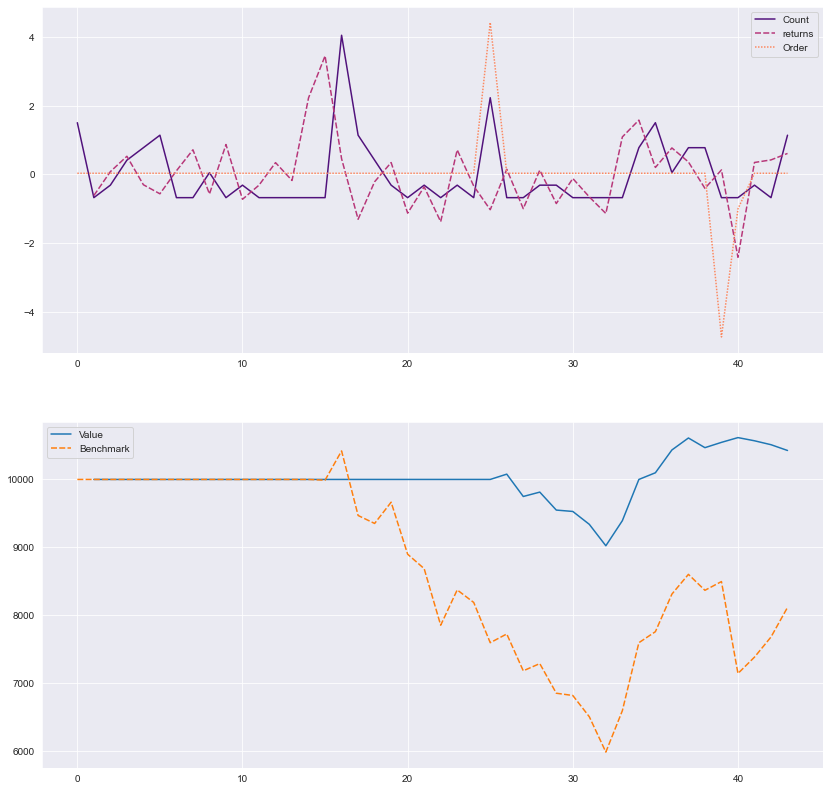

In [35]:
def download(ticker, start, end, today = True):
    temp_path = os.getcwd().replace('code','temp')
    if today == True:
        today = datetime.datetime.today()
        end = '-'.join([str(today.year),str(today.month),str(today.day)])
    df = build_stock_df(ticker, start ,end)
    df.to_csv('\\'.join([temp_path,'local.csv']))
    return temp_path

def gen_Order_StratCountPoisson(df, budget, window = 5, p_u = 0.1, p_l = 0.1, std_adjust = False):
    df = df.reset_index()
    df.loc[:,'Count_MA'] = df.loc[:,'Count'].shift(1).rolling(window).mean()
    df.loc[:,'Count_STD'] = df.loc[:,'Count'].shift(1).rolling(window).std()
    
    # Leaving sigmoid for now. 
    df.loc[:,'Count_Sigmoid'] = ((df.loc[:,'Count'] - df.loc[:,'Count_MA']) / np.sqrt(df.loc[:,'Count_MA']
                                                                                    )).apply(lambda x : sigmoid(x,
                                                                                                               func = 'abs')
                                                                                            )
    if std_adjust == False: 
        df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = 1-p_u , mu = x))
        df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = p_l, mu = x))
    else: 
        df.loc[:,'Upper_inverse'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = 1-p_u, mu = x))
        df.loc[:,'Lower_inverse'] = df.loc[:,'Count_MA'].apply(lambda x : poisson.ppf(q = p_l, mu = x))
        df.loc[:,'std_scalar_u'] = (df.loc[:,'Upper_inverse'] - df.loc[:,'Count_MA'])/np.sqrt(df.loc[:,'Count_MA'])
        df.loc[:,'std_scalar_l'] = (df.loc[:,'Count_MA'] - df.loc[:,'Lower_inverse'])/np.sqrt(df.loc[:,'Count_MA'])
        df.loc[:,'Count_Upper'] = df.loc[:,'Count_MA'] + df.loc[:,'Count_STD'] * df.loc[:,'std_scalar_u']
        df.loc[:,'Count_Lower'] = df.loc[:,'Count_MA'] - df.loc[:,'Count_STD'] * df.loc[:,'std_scalar_l'] 
    
    
    df.loc[:,'Order'] = [0] * len(df)
    long_filt = df.loc[:,'Count_Upper']<df.loc[:,'Count']
    short_filt = df.loc[:,'Count_Lower']>df.loc[:,'Count']
    df.loc[short_filt,'Order'] = -1
    df.loc[long_filt, 'Order'] = 1
    
    return df

def backtest_CountPoisson(df, budget, leverage, long_tol, short_tol, risk_control = 'stop-loss_liquidation', stop_loss_ratio = 0.2): 
    
    df.loc[0,'Cash'] = budget
    df.loc[0,'Position'] = 0
    
    for i in range(1,len(df)):
        # Short liquidation implemented here, regardless or long or short: 
        liquidation = 0
        if risk_control == 'stop-loss_liquidation':
            if df.loc[i-1,'Position'] < 0 and df.loc[:,'Value'].diff().loc[i-1]/budget < -stop_loss_ratio:
                liquidation = min(df.loc[i-1,'Cash'] // df.loc[i,'Close'], -df.loc[i-1,'Position'])
      
        if df.loc[i,'Order'] == 0: 
            df.loc[i,'Order'] = liquidation
            
        elif df.loc[i,'Order'] == 1:
            if df.loc[i-1,'Cash'] > 0:
                potential_order = (df.loc[i-1,'Cash'] * long_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
                df.loc[i,'Order'] = max(liquidation, potential_order)

            else:
                df.loc[i,'Order'] = 0
                
            # Short liquidation implemented here: 

        elif df.loc[i,'Order'] == -1:
            if df.loc[i-1,'Position'] > 0: 
                # if the position is positve, can short (sell existing position) more
                df.loc[i,'Order'] = -(df.loc[i-1,'Value'] * short_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']

            else: 
                # if the position is negative, and algorithm tells bearish, 
                # Don't liquidate. 
                # Liquidation can be 0 here, or positive. 
#                 df.loc[i,'Order'] = 0
                potential_order = -(df.loc[i-1,'Value'] * short_tol * np.abs(df.loc[i,'Count_Sigmoid'])) // df.loc[i,'Close']
                maximum_order = -df.loc[i-1,'Position'] - budget * leverage // df.loc[i,'Close']
                df.loc[i,'Order'] = max( potential_order, maximum_order ) + liquidation
            
        # Accounting
        expense = -df.loc[i,'Close'] * df.loc[i,'Order']
        df.loc[i,'Cash'] = expense + df.loc[i-1,'Cash']
        df.loc[i,'Position'] = df.loc[:i,'Order'].cumsum()[i]
        df.loc[i,'Value'] = df.loc[i,'Position'] * df.loc[i,'Close'] + df.loc[i,'Cash']
    
    return df 

def comp_metric(df, budget, metric = 'sharpe', return_col = 'Value_return', col = 'Value'):
    if metric == 'sharpe':
        if df.loc[:,return_col].std() != 0:
            r = df.loc[:,return_col].mean()/df.loc[:,return_col].std()
        else:
            r = 0
    elif metric == 'sortino':
        return_mean = df.loc[:,return_col].mean()
        downside_filt = (df.loc[:,return_col] < return_mean)
        downside_std = df.loc[downside_filt,return_col].std()
        if downside_std > 0:
            r = return_mean/downside_std
        else:
            r = 0
    elif metric == 'mdd': 
        ddl = []
        for t in range(len(df)):
            ddl.append(df.reset_index().loc[t,col] - df.reset_index().loc[t:len(df)-1,col].min())
        r = -max(ddl) / budget
    return df, r

def CV_CountPoisson(ticker, start, end, budget, leverage, today, 
                    freq_p, freq_tol, p_lim, b_list,
                    W, N, viz, progress_ind, metric, method,
                   risk_control = 'stop-loss_liquidation', stop_loss_ratio = 0.2):

    # Download universe only once, maximum scope. 
    temp_path = download(ticker,start, end, today)
    universe = pd.read_csv('\\'.join([temp_path,'local.csv']))
    U = len(universe)
    
    # Initialize 
    OUT = []
    universe.loc[:,'Order'] = [0] * len(universe)
    universe.loc[0,'Cash'] = budget
    universe.loc[0,'Position'] = 0
    
    
    # Initialize parameter list
    Param_list = []
    for i in range(U-N-2*W): # from day (n+w+1) to day U:
        # Use data from past (n+w) days. 
        
        # 1. Train on subuniverse. 
            # Write me: 
            #    #### THIS IS THE BIG FISH ####    # 
            # Opt_CountSigmoid() 
            #    #### THIS IS THE BIG FISH ####    # 
            # return a list of parameters. 
            # Record. 
            
        sub_universe = universe.loc[i:2*W+N-2+i,:]
        
        param_dict = Opt_CountPoisson(df_0 = sub_universe, 
                                      budget = budget, 
                                      leverage = leverage,
                                      freq_p = freq_p, 
                                      freq_tol = freq_tol, 
                                      p_lim = p_lim, 
                                      W = W, 
                                      b_list = b_list,
                                     progress_ind = progress_ind, 
                                      method = method, 
                                      metric = metric)

        Param_list.append(param_dict)   
        
        print('Training ', str(round((i+1)/(U-N-2*W)*100,2))+'% ',
             'done.',
              sep='')
        print(param_dict)
    
    # 2. Trade on (df.loc[N+W+i,:]), 
    # Use data: df.loc[N+1+i:N+W+i,:]
    # obtain a order number. (on basis of gen_Order and backtest_)
    # Record. 
    
    for i in range(U-N-2*W):
        # CHECK INDEX # CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX
        param_dict = Param_list[i]
        adjust, p_u, p_l, long_tol, short_tol = param_dict['adjust'], param_dict['p_u'], param_dict['p_l'], param_dict['long_tol'], param_dict['short_tol']
        window = universe.loc[W+N+i:2*W+N-1+i,:]
        Count_MA = window.loc[:,'Count'].mean()
        Count_STD = window.loc[:,'Count'].std()
        Count = universe.loc[N+2*W+i,'Count']
        universe.loc[N+2*W+i,'Count_Sigmoid'] = sigmoid(((Count - Count_MA) / np.sqrt(Count_MA)),
                                                       func = 'abs')
        if adjust == False:
            Count_Upper = poisson.ppf(q = 1-p_u, mu = Count_MA)
            Count_Lower = poisson.ppf(q = p_l, mu = Count_MA)
        else:
            Upper_inverse = poisson.ppf(q = 1-p_u, mu = Count_MA)
            Lower_inverse = poisson.ppf(q = p_l, mu = Count_MA)
            std_scalar_u = (Upper_inverse - Count_MA)/np.sqrt(Count_MA)
            std_scalar_l = (Count_MA - Lower_inverse)/np.sqrt(Count_MA)
            Count_Upper = Count_MA + Count_STD * std_scalar_u
            Count_Lower = Count_MA - Count_STD * std_scalar_l
            universe.loc[N+2*W+i,'std_scalar_u'] = std_scalar_u 
            universe.loc[N+2*W+i,'std_scalar_l'] = std_scalar_l 
            
        universe.loc[N+2*W+i,'Count_Upper'] = Count_Upper
        universe.loc[N+2*W+i,'Count_Lower'] = Count_Lower
        universe.loc[N+2*W+i,'short_tol'] = short_tol
        universe.loc[N+2*W+i,'long_tol'] = long_tol 
        universe.loc[N+2*W+i,'p_u'] = p_u
        universe.loc[N+2*W+i,'p_l'] = p_l

        
        # 2.1 Make order decisions. 
        
        if Count_Upper < Count:
            universe.loc[N+2*W+i,'Order'] = 1
            
        elif Count_Lower > Count:
            universe.loc[N+2*W+i,'Order'] = -1
            
        
    # 2.2 Edit order decisions. 
    for i in range(1,len(universe)):
        
        # Short liquidation implemented here, regardless or long or short: 
        liquidation = 0
        if universe.loc[i-1,'Position'] < 0 and universe.loc[:,'Value'].diff().loc[i-1]/budget < -stop_loss_ratio:
            liquidation = min(universe.loc[i-1,'Cash'] // universe.loc[i,'Close'], -universe.loc[i-1,'Position'])
        
        if universe.loc[i,'Order'] == 0: 
            universe.loc[i,'Order'] = liquidation
            
        elif universe.loc[i,'Order'] == 1:
            if universe.loc[i-1,'Cash'] > 0:
                potential_order = (universe.loc[i-1,'Cash'] * universe.loc[i,'long_tol'] * \
                                   np.abs(universe.loc[i,'Count_Sigmoid'])) // universe.loc[i,'Close']
                universe.loc[i,'Order'] = max(liquidation, potential_order)

            else:
                universe.loc[i,'Order'] = 0

        elif universe.loc[i,'Order'] == -1:
            if universe.loc[i-1,'Position'] > 0: 
                # if the position is positve, can short (sell existing position) more
                universe.loc[i,'Order'] = -(universe.loc[i-1,'Value'] * universe.loc[i,'short_tol'] * \
                                            np.abs(universe.loc[i,'Count_Sigmoid'])) // universe.loc[i,'Close']

            else: 
                # if the position is negative, and algorithm tells bearish, 
                # Don't liquidate. 
                # Liquidation can be 0 here, or positive. 
#                 universe.loc[i,'Order'] = 0
                
                potential_order = -(universe.loc[i-1,'Value'] * universe.loc[i,'short_tol'] * \
                                    np.abs(universe.loc[i,'Count_Sigmoid'])) // universe.loc[i,'Close']
                maximum_order = -universe.loc[i-1,'Position'] - budget * leverage // universe.loc[i,'Close']
                universe.loc[i,'Order'] = max( potential_order, maximum_order ) + liquidation
                
        expense = -universe.loc[i,'Close'] * universe.loc[i,'Order']
        universe.loc[i,'Cash'] = expense + universe.loc[i-1,'Cash']
        universe.loc[i,'Position'] = universe.loc[:i,'Order'].cumsum()[i]
        universe.loc[i,'Value'] = universe.loc[i,'Position'] * universe.loc[i,'Close'] + universe.loc[i,'Cash']
    
    

    # 3. Build df (on basis of second half of main_)
        # Imbue benchmark and compute portfolio value 
        # output Sharpe. 
        
    # first trading day index W+N. 
    universe.loc[:,'Benchmark'] = universe.loc[:,'Close'] * (budget // universe.loc[N+2*W,'Close'])
    universe.loc[universe.loc[:,'short_tol'].isna(),'Benchmark'] = budget
    universe.loc[:,'Value_return'] = (universe.loc[:,'Value'] - universe.loc[:,'Value'].shift(1))/universe.loc[:,'Value'].shift(1)
    universe.loc[:,'Bench_return'] = (universe.loc[:,'Benchmark'] - universe.loc[:,'Benchmark'].shift(1))/universe.loc[:,'Benchmark'].shift(1)
    universe.loc[:,'returns'] = (universe.loc[:,'Close'] - universe.loc[:,'Close'].shift(1))/universe.loc[:,'Close']
    df_v, value_metric = comp_metric(df = universe, metric = metric, return_col = 'Value_return', col = 'Value', budget = budget)
    df_b, bench_metric = comp_metric(df = universe, metric = metric, return_col = 'Bench_return', col = 'Benchmark', budget = budget)
    print(universe)
    print('The evaluation metric is ',metric,sep='')
    print('Portfolio value metric is',value_metric)
    print('Benchmark value metric is',bench_metric) 
    
    # 4. Visualization: 
    if viz == True:
        fig, axes = plt.subplots(2,1, sharex = False, figsize = [14,14])
        sns.set_style('darkgrid') 
        norm_df = norm(universe.loc[:,['Count','returns','Order']], how = 'prob')
        #     norm_df = norm(df.loc[:,['returns','Count_normal']], how = 'prob')
        sns.lineplot(ax= axes[0], data = norm_df, palette = 'magma')
        sns.lineplot(ax= axes[1], data = universe.loc[:,['Value','Benchmark']])
        plt.show() 
    
    universe.to_csv(os.getcwd().replace('code', 'temp') + '\\' + 'universe.csv')
    
    return # OUTPUT: a LIST of CV measures, length = (U-N-W)

def Opt_CountPoisson(df_0, budget, leverage, freq_p, freq_tol, p_lim, W, b_list = [True, False],
                     progress_ind = True, method = 'p-tol', metric = 'sharpe'):
    # What to do here: 
    # 1. Run grid search on df 
    # 1.1 std-short_risk scalar search. 
    if method == 'p-tol': 
        result = []
#         for b in [True, False]:
        for b in b_list:
            for u in np.arange(0, p_lim+freq_p, freq_p):
                for l in np.arange(0, p_lim+freq_p, freq_p):
# (df, budget, window = 5, p_u = 0.1, p_l = 0.1, std_adjust = False)
                
                    df = gen_Order_StratCountPoisson(df = df_0, budget = budget,window = W, 
                                                     p_u = u, p_l = l, std_adjust = b)
                    df = backtest_CountPoisson(df = df, budget = budget, leverage = leverage, 
                                               long_tol = 1, short_tol = 1)    
        #             df = df.dropna(how = 'any', subset = ['Count'])
                    df = df.dropna(how = 'any')
                    
                    
                    # metrics generation:
                    df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)
                    df, r = comp_metric(df, metric = metric, return_col = 'Value_return', col = 'Value', budget = budget)
                    print([b, u, l , r])
                    result.append([b, u, l, r])

                    # indicating progress: 
                    if progress_ind == True:
                        progress = (1-b)/len(b_list) + (1/len(b_list)) * u / (p_lim + freq_p) + \
                            (1/len(b_list)) * freq_p / (p_lim+freq_p)**2 * l 
            #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                        print('Threshold probability search ',round(progress * 100,3),'% done.',sep = ''
                             ) 

        result = pd.DataFrame(result, columns = ['adjust','p_u','p_l','r'])
        print(result)
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'adjust'].mode())
        print(top.loc[:,'p_u'].mode())
        print(top.loc[:,'p_l'].mode())
        adjust_param = top.loc[:,'adjust'].mode().median()
        p_u_param = top.loc[:,'p_u'].mode().median()
        p_l_param = top.loc[:,'p_l'].mode().median()

        # 1.2 long-short_tol search
        result = []

        for l in np.arange(0,1+freq_tol, freq_tol):
            for s in np.arange(0,1+freq_tol, freq_tol):
                df = gen_Order_StratCountPoisson(df = df_0, budget = budget,window = W, 
                                                 p_u = p_u_param, p_l = p_l_param, std_adjust = adjust_param)
                df = backtest_CountPoisson(df = df, budget = budget, leverage = leverage,
                                           long_tol = l, short_tol = s)    
    #             df = df.dropna(how = 'any', subset = ['Count'])
                df = df.dropna(how = 'any')

                # metrics generation:
                df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)
                df, r = comp_metric(df, metric = metric, return_col = 'Value_return', col = 'Value', budget = budget)

                result.append([l, s, r])

                # indicating progress: 
                if progress_ind == True:
                    progress = (l)/1 + s/1 * freq_tol/1
        #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                    print('long-short tolerance search ',round(progress * 100,3),'% done.',sep = ''
                         )
            
        result = pd.DataFrame(result, columns = ['long_tol','short_tol','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'long_tol'].mode())
        print(top.loc[:,'short_tol'].mode())
        long_tol_param = top.loc[:,'long_tol'].mode().median()
        short_tol_param = top.loc[:,'short_tol'].mode().median()

    elif method == 'tol-p':
        result = []

        for l in np.arange(0,1+freq_tol, freq_tol):
            for s in np.arange(0,1+freq_tol, freq_tol):
                df = gen_Order_StratCountPoisson(df = df_0, budget = budget,window = W, 
                                         p_u = 0.1, p_l = 0.1, std_adjust = True)

                df = backtest_CountPoisson(df = df, budget = budget, leverage = leverage,
                                           long_tol = l, short_tol = s)    
    #             df = df.dropna(how = 'any', subset = ['Count'])
                df = df.dropna(how = 'any')

                # metrics generation:
                df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)
                df, r = comp_metric(df, metric = metric, return_col = 'Value_return', col = 'Value', budget = budget)

                result.append([l, s, r])

                # indicating progress: 
                if progress_ind == True:
                    progress = (l)/1 + s/1 * freq_tol/1
        #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                    print('long-short tolerance search ',round(progress * 100,3),'% done.',sep = ''
                         )
            
        result = pd.DataFrame(result, columns = ['long_tol','short_tol','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'long_tol'].mode())
        print(top.loc[:,'short_tol'].mode())
        long_tol_param = top.loc[:,'long_tol'].mode().median()
        short_tol_param = top.loc[:,'short_tol'].mode().median()
        
        result = []
        for b in b_list:
            for u in np.arange(0, p_lim+freq_p, freq_p):
                for l in np.arange(0, p_lim+freq_p, freq_p):
# (df, budget, window = 5, p_u = 0.1, p_l = 0.1, std_adjust = False)
                
                    df = gen_Order_StratCountPoisson(df = df_0, budget = budget,window = W, 
                                                     p_u = u, p_l = l, std_adjust = b)
                    df = backtest_CountPoisson(df = df, budget = budget, leverage = leverage,
                                               long_tol = long_tol_param, short_tol = short_tol_param)    
        #             df = df.dropna(how = 'any', subset = ['Count'])
                    df = df.dropna(how = 'any')

                    # metrics generation:
                    df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)

                    df, r = comp_metric(df, metric = metric, return_col = 'Value_return', col = 'Value', budget = budget)

                    result.append([b, u, l, r])

                    # indicating progress: 
                    if progress_ind == True:
                        progress = (1-b)/len(b_list) + (1/len(b_list)) * u / (p_lim + freq_p) + \
                            (1/len(b_list)) * freq_p / (p_lim+freq_p)**2 * l 
            #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                        print('Threshold probability search ',round(progress * 100,3),'% done.',sep = ''
                             )
            
        result = pd.DataFrame(result, columns = ['adjust','p_u','p_l','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'adjust'].mode())
        print(top.loc[:,'p_u'].mode())
        print(top.loc[:,'p_l'].mode())
        adjust_param = top.loc[:,'adjust'].mode().median()
        p_u_param = top.loc[:,'p_u'].mode().median()
        p_l_param = top.loc[:,'p_l'].mode().median()
        
        
        
    # 2. Add in running indicators, show progress. 
    elif method == 'composite': # I am not proud of this. 
        result = []
        for b in b_list:
            for u in np.arange(0, p_lim+freq_p, freq_p):
                for lo in np.arange(0, p_lim+freq_p, freq_p):
                    for l in np.arange(0,1+freq_tol, freq_tol):
                        for s in np.arange(0,1+freq_tol, freq_tol):
           
                            df = gen_Order_StratCountPoisson(df = df_0, budget = budget,window = W, 
                                         p_u = u, p_l = lo, std_adjust = b)
                            df = backtest_CountPoisson(df = df, budget = budget, leverage = leverage,
                                                       long_tol = l, short_tol = s)
                #             df = df.dropna(how = 'any', subset = ['Count'])
        
                            df = df.dropna(how = 'any')
                   
                            # metrics generation:
                            df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)
                            df, r = comp_metric(df, metric = metric, return_col = 'Value_return', col = 'Value', budget = budget)

                            result.append([b, u, lo, l,s, r])
                            if progress_ind == True:
                                progress = (b_list.index(b))/len(b_list) + (1/len(b_list)) * u / (p_lim + freq_p) + \
                                    (1/len(b_list)) * freq_p / (p_lim+freq_p)**2 * lo + \
                                    (1/len(b_list)) * freq_p**2  / (p_lim+freq_p)**2 / (1+freq_tol) * l +\
                                    (1/len(b_list)) * freq_p**2 * freq_tol / (p_lim+freq_p)**2 / (1+freq_tol)**2 * s
                    #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                                print('Composite search '+str(round(progress * 100,3))+'% done.',end = '\r')
                                     
        result = pd.DataFrame(result, columns = ['adjust','p_u','p_l','long_tol','short_tol','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'adjust'].mode())
        print(top.loc[:,'p_u'].mode())
        print(top.loc[:,'p_l'].mode())
        print(top.loc[:,'long_tol'].mode())
        print(top.loc[:,'short_tol'].mode())
        adjust_param = top.loc[:,'adjust'].mode()[0]
        
#         print('\n'*10)
#         print(adjust_param)
#         print(type(adjust_param))
#         print(adjust_param[0])
#         print(type(adjust_param[0]))
#         print('\n'*10)
        p_u_param = top.loc[:,'p_u'].mode().median()
        p_l_param = top.loc[:,'p_l'].mode().median()
        long_tol_param = top.loc[:,'long_tol'].mode().median()
        short_tol_param = top.loc[:,'short_tol'].mode().median()

    param_dict = {'adjust': adjust_param, 'p_u':round(p_u_param, 3), 'p_l':round(p_l_param,3),
                 'long_tol':round(long_tol_param,3), 'short_tol':round(short_tol_param,3)} 
                        
    return param_dict

# budget = 10000
# df = build_stock_df('CLOV', '2021-3-1','2021-7-1')
# df.loc[:,'returns'] = (df.loc[:,'Close'] - df.loc[:,'Close'].shift(1))/df.loc[:,'Close'].shift(1)
# df = gen_Order_StratCountPoisson(df = df, budget = budget, window = 5, 
#                                 p_u = 0.1, p_l = 0.1, std_adjust = True, short_risk_scalar = 2)

# df = backtest_CountPoisson(df, budget = budget, long_tol = 0.2, short_tol = 0.2)
# df = df.dropna(how = 'any', subset = ['Count'])
# df.loc[:,'Benchmark'] = df.loc[:,'Close'] * (budget // df.loc[0,'Close'])
# df.set_index('Date')

# norm_df = norm(df.loc[:,['Count','returns','Order']], how = 'prob')
# #     norm_df = norm(df.loc[:,['returns','Count_normal']], how = 'prob')


# fig, axes = plt.subplots(2,1, figsize = [14,14],sharex = False)
# sns.set_style('darkgrid') 
# norm_df = norm(df.loc[:,['Count','returns','Order']], how = 'prob')

# #     norm_df = norm(df.loc[:,['returns','Count_normal']], how = 'prob')
# sns.lineplot(ax = axes[0], data = norm_df, palette = 'magma')
# sns.lineplot(ax = axes[1], data = df.loc[:,['Value','Benchmark']])
# r = (df.loc[len(df)-1,'Value']-budget)/budget
# print('return in total is',
#       r)
# df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)
# df.loc[:,'Bench_return'] = (df.loc[:,'Benchmark'] - df.loc[:,'Benchmark'].shift(1))/df.loc[:,'Benchmark'].shift(1)
# value_sharpe = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()
# benchmark_sharpe = df.loc[:,'Bench_return'].mean()/df.loc[:,'Bench_return'].std()
# print('Portfolio value Sharpe ratio is',value_sharpe)
# print('Benchmark value Sharpe ratio is',benchmark_sharpe)


global adjust_param



CV_CountPoisson(ticker = 'CLNE', 
                start = '2021-1-8', 
                end = '2021-4-2', 
                budget = 10000, 
                leverage = 2,
                today = False, 
                freq_p = 0.02,
                freq_tol = 0.1,
                p_lim = 0.1,
                b_list = [False],
                W = 5, N = 5, 
                viz = True, 
                progress_ind = True,
                metric = 'sortino',
                method = 'composite'
               )         



In [ ]:
def download(ticker, start, end, today = True):
    temp_path = os.getcwd().replace('code','temp')
    if today == True:
        today = datetime.datetime.today()
        end = '-'.join([str(today.year),str(today.month),str(today.day)])
    df = build_stock_df(ticker, start ,end)
    df.to_csv('\\'.join([temp_path,'local.csv']))
    return temp_path
    
def CV_CountSigmoid(ticker, start, end, budget, today, 
                    freq_std_short, freq_tol, std_short_lim, 
                    W, N, viz, progress_ind, metric, method):
    # Download universe only once, maximum scope. 
    temp_path = download(ticker,start, end, today)
    universe = pd.read_csv('\\'.join([temp_path,'local.csv']))
    U = len(universe)
    
    # Initialize 
    OUT = []
    universe.loc[:,'Order'] = [0] * len(universe)
    universe.loc[0,'Cash'] = budget
    
    
    # Initialize parameter list
    Param_list = []
    for i in range(U-N-2*W): # from day (n+w+1) to day U:
        # Use data from past (n+w) days. 
        
        # 1. Train on subuniverse. 
            # Write me: 
            #    #### THIS IS THE BIG FISH ####    # 
            # Opt_CountSigmoid() 
            #    #### THIS IS THE BIG FISH ####    # 
            # return a list of parameters. 
            # Record. 
            
        sub_universe = universe.loc[i:2*W+N-2+i,:]
        
        param_dict = Opt_CountSigmoid(df_0 = sub_universe, 
                                   budget = budget,
                                   freq_std_short = freq_std_short,
                                   freq_tol = freq_tol,
                                   std_short_lim = std_short_lim,
                                   W = W, 
                                     progress_ind = progress_ind,
                                     metric = metric,
                                     method = method)
        Param_list.append(param_dict)   
        
        print('Training ', str(round((i+1)/(U-N-2*W)*100,2))+'% ',
             'done.',
              sep='')
        print(param_dict)
    
    # 2. Trade on (df.loc[N+W+i,:]), 
    # Use data: df.loc[N+1+i:N+W+i,:]
    # obtain a order number. (on basis of gen_Order and backtest_)
    # Record. 
    
    for i in range(U-N-2*W):
        # CHECK INDEX # CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX# CHECK INDEX
        param_dict = Param_list[i]
        window = universe.loc[W+N+i:2*W+N-1+i,:]
        Count_MA = window.loc[:,'Count'].mean()
        Count_STD = window.loc[:,'Count'].std()
        Count = universe.loc[N+2*W+i,'Count']
        universe.loc[N+2*W+i,'Count_Sigmoid'] = sigmoid( (Count - Count_MA) / Count_STD )
        Count_Upper = Count_MA + Count_STD * param_dict['std']
        Count_Lower = Count_MA - Count_STD * param_dict['std'] * param_dict['short']
        universe.loc[N+2*W+i,'Count_Upper'] = Count_Upper
        universe.loc[N+2*W+i,'Count_Lower'] = Count_Lower
        universe.loc[N+2*W+i,'short_tol'] = param_dict['short_tol']
        universe.loc[N+2*W+i,'long_tol'] = param_dict['long_tol']    
        
        # 2.1 Make order decisions. 
        
        if Count_Upper < Count:
            universe.loc[N+2*W+i,'Order'] = 1
            
        elif Count_Lower > Count:
            universe.loc[N+2*W+i,'Order'] = -1
            
        
    # 2.2 Edit order decisions. 
    
    for i in range(1,len(universe)):
        
        if universe.loc[i,'Order'] == 0:
            universe.loc[i,'Cash'] = universe.loc[i-1,'Cash']
            universe.loc[i,'Position'] = universe.loc[:i,'Order'].cumsum()[i]
            universe.loc[i,'Value'] = universe.loc[i,'Position'] * universe.loc[i,'Close'] + universe.loc[i,'Cash']
            
        elif universe.loc[i,'Order'] == 1:
            universe.loc[i,'Order'] = (universe.loc[i-1,'Cash'] * universe.loc[i,'long_tol'] * np.abs(universe.loc[i,'Count_Sigmoid'])) // \
                                        universe.loc[i,'Close']
            expense = -universe.loc[i,'Close'] * universe.loc[i,'Order']
            universe.loc[i,'Cash'] = expense + universe.loc[i-1,'Cash']
            universe.loc[i,'Position'] = universe.loc[:i,'Order'].cumsum()[i]
            universe.loc[i,'Value'] = universe.loc[i,'Position'] * universe.loc[i,'Close'] + universe.loc[i,'Cash']

        elif universe.loc[i,'Order'] == -1:
            universe.loc[i,'Order'] = -(universe.loc[i-1,'Value'] * universe.loc[i,'short_tol'] * np.abs(universe.loc[i,'Count_Sigmoid'])) // \
                                        universe.loc[i,'Close']
            expense = -universe.loc[i,'Close'] * universe.loc[i,'Order']
            universe.loc[i,'Cash'] = expense + universe.loc[i-1,'Cash']
            universe.loc[i,'Position'] = universe.loc[:i,'Order'].cumsum()[i]
            universe.loc[i,'Value'] = universe.loc[i,'Position'] * universe.loc[i,'Close'] + universe.loc[i,'Cash']
    
    

    # 3. Build df (on basis of second half of main_)
        # Imbue benchmark and compute portfolio value 
        # output Sharpe. 
        
    # first trading day index W+N. 
    universe.loc[:,'Benchmark'] = universe.loc[:,'Close'] * (budget // universe.loc[N+2*W,'Close'])
    universe.loc[universe.loc[:,'short_tol'].isna(),'Benchmark'] = budget
    universe.loc[:,'Value_return'] = (universe.loc[:,'Value'] - universe.loc[:,'Value'].shift(1))/universe.loc[:,'Value'].shift(1)
    universe.loc[:,'Bench_return'] = (universe.loc[:,'Benchmark'] - universe.loc[:,'Benchmark'].shift(1))/universe.loc[:,'Benchmark'].shift(1)
    universe.loc[:,'returns'] = (universe.loc[:,'Close'] - universe.loc[:,'Close'].shift(1))/universe.loc[:,'Close']
    value_sharpe = universe.loc[:,'Value_return'].mean()/universe.loc[:,'Value_return'].std()
    benchmark_sharpe = universe.loc[:,'Bench_return'].mean()/universe.loc[:,'Bench_return'].std()
    print(universe)
    
    print('Portfolio value Sharpe ratio is',value_sharpe)
    print('Benchmark value Sharpe ratio is',benchmark_sharpe) 
    
    # 4. Visualization: 
    if viz == True:
        fig, axes = plt.subplots(2,1, sharex = False, figsize = [14,14])
        sns.set_style('darkgrid') 
        norm_df = norm(universe.loc[:,['Count','returns','Order']], how = 'prob')
        #     norm_df = norm(df.loc[:,['returns','Count_normal']], how = 'prob')
        sns.lineplot(ax= axes[0], data = norm_df, palette = 'magma')
        sns.lineplot(ax= axes[1], data = universe.loc[:,['Value','Benchmark']])
        plt.show() 
    
    universe.to_csv(os.getcwd().replace('code', 'temp') + '\\' + 'universe.csv')
    
    
            
        
        
        
    
    return # OUTPUT: a LIST of CV measures, length = (U-N-W)
    
# Maybe can add in optimization for W too. 
def Opt_CountSigmoid(df_0, budget, freq_std_short, freq_tol, std_short_lim, W, 
                     progress_ind = True, method = 'thresh-tol', metric = 'sharpe'):
    # What to do here: 
    # 1. Run grid search on df 
    # 1.1 std-short_risk scalar search. 
    std_lim, short_lim = std_short_lim[0], std_short_lim[1]
    if method == 'thresh-tol': 
        result = []
    #     for std in np.arange(freq_std_short,std_lim+freq_std_short,freq_std_short):
    #         for short in np.arange(freq_std_short,short_lim+freq_std_short,freq_std_short):
        for std in np.arange(0,std_lim+freq_std_short,freq_std_short):
            for short in np.arange(0,short_lim+freq_std_short,freq_std_short):

                df = gen_Order_StratCountSigmoid(df = df_0, budget = budget,window = W, 
                                                 std_scalar = std, short_risk_scalar = short)
                df = backtest_CountSigmoid(df = df, budget = budget, long_tol = 1, short_tol = 1)    
    #             df = df.dropna(how = 'any', subset = ['Count'])
                df = df.dropna(how = 'any')

                # metrics generation:
                df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)

                # Sharpe: 
                if metric == 'sharpe':
                    if df.loc[:,'Value_return'].std() != 0:
                        r = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()

                    else:
                        r = 0

                # Sortino: 
                elif metric == 'sortino':
                    return_mean = df.loc[:,'Value_return'].mean()
                    downside_filt = (df.loc[:,'Value_return'] < return_mean)
                    downside_std = df.loc[downside_filt,'Value_return'].std()
                    if downside_std != 0:
                        r = return_mean/downside_std
                    else:
                        r = 0

                # MDD:
                elif metric == 'mdd': 
                    ddl = []
                    for t in range(len(df)):
                        ddl.append(df.reset_index().loc[t,'Value'] - df.reset_index().loc[t:len(df)-1,'Value'].min())
                    r = -max(ddl) / budget




                result.append([std, short, r])

                # indicating progress: 
                if progress_ind == True:
                    progress = (std-freq_std_short)/std_lim + short/short_lim * freq_std_short/std_lim
        #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                    print('std-short_risk scalar search ',round(progress * 100,3),'% done.',sep = ''
                         )

        result = pd.DataFrame(result, columns = ['std','short','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'std'].mode())
        print(top.loc[:,'short'].mode())
        std_param = top.loc[:,'std'].mode().median()
        short_param = top.loc[:,'short'].mode().median()

        # 1.2 long-short_tol search
        result = []
    #     for l in np.arange(freq_tol,1+freq_tol, freq_tol):
    #         for s in np.arange(freq_tol,1+freq_tol, freq_tol):
        for l in np.arange(0,1+freq_tol, freq_tol):
            for s in np.arange(-1,1+freq_tol, freq_tol):

                df = gen_Order_StratCountSigmoid(df = df_0, budget = budget,window = W, 
                                                 std_scalar = std_param, short_risk_scalar = short_param)
                df = backtest_CountSigmoid(df = df, budget = budget, long_tol = l, short_tol = s)    
    #             print(df)
                df = df.dropna(how = 'any', subset = ['Count'])

                # metrics generation:
                df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)

                # Sharpe: 
                if metric == 'sharpe':

                    if df.loc[:,'Value_return'].std() != 0:
                        r = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()   
                    else:
                        r = 0

                # Sortino: 
                elif metric == 'sortino':
                    return_mean = df.loc[:,'Value_return'].mean()
                    downside_filt = (df.loc[:,'Value_return'] < return_mean)
                    downside_std = df.loc[downside_filt,'Value_return'].std()

                    if downside_std != 0:
                        r = return_mean/downside_std
                    else:
                        r = 0

                # MDD:
                elif metric == 'mdd': 
                    ddl = []
                    for t in range(len(df)):
                        ddl.append(df.reset_index().loc[t,'Value'] - df.reset_index().loc[t:len(df)-1,'Value'].min())
                    r = -max(ddl) / budget

                result.append([l, s, r])

                # indicating progress: 
                if progress_ind == True:
                    progress = (l-freq_tol)/1 + s/1 * freq_tol/1
        #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                    print('long-short tolerance search ',round(progress * 100,3),'% done.',sep = ''
                         )
        result = pd.DataFrame(result, columns = ['long_tol','short_tol','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'long_tol'].mode())
        print(top.loc[:,'short_tol'].mode())
        long_tol_param = top.loc[:,'long_tol'].mode().median()
        short_tol_param = top.loc[:,'short_tol'].mode().median()

    elif method == 'tol-thresh':
        result = []
        for l in np.arange(0,1+freq_tol, freq_tol):
            for s in np.arange(-1,1+freq_tol, freq_tol):

                df = gen_Order_StratCountSigmoid(df = df_0, budget = budget,window = W, 
                                                 std_scalar = 0, short_risk_scalar = 1)
                df = backtest_CountSigmoid(df = df, budget = budget, long_tol = l, short_tol = s)    
    #             print(df)
                df = df.dropna(how = 'any', subset = ['Count'])

                # metrics generation:
                df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)

                # Sharpe: 
                if metric == 'sharpe':

                    if df.loc[:,'Value_return'].std() != 0:
                        r = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()   
                    else:
                        r = 0

                # Sortino: 
                elif metric == 'sortino':
                    return_mean = df.loc[:,'Value_return'].mean()
                    downside_filt = (df.loc[:,'Value_return'] < return_mean)
                    downside_std = df.loc[downside_filt,'Value_return'].std()

                    if downside_std != 0:
                        r = return_mean/downside_std
                    else:
                        r = 0

                # MDD:
                elif metric == 'mdd': 
                    ddl = []
                    for t in range(len(df)):
                        ddl.append(df.reset_index().loc[t,'Value'] - df.reset_index().loc[t:len(df)-1,'Value'].min())
                    r = -max(ddl) / budget

                result.append([l, s, r])

                # indicating progress: 
                if progress_ind == True:
                    progress = (l-freq_tol)/1 + s/1 * freq_tol/1
        #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                    print('long-short tolerance search ',round(progress * 100,3),'% done.',sep = ''
                         )
        result = pd.DataFrame(result, columns = ['long_tol','short_tol','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'long_tol'].mode())
        print(top.loc[:,'short_tol'].mode())
        long_tol_param = top.loc[:,'long_tol'].mode().median()
        short_tol_param = top.loc[:,'short_tol'].mode().median()
        
        result = []
        for std in np.arange(0,std_lim+freq_std_short,freq_std_short):
            for short in np.arange(0,short_lim+freq_std_short,freq_std_short):

                df = gen_Order_StratCountSigmoid(df = df_0, budget = budget,window = W, 
                                                 std_scalar = std, short_risk_scalar = short)
                df = backtest_CountSigmoid(df = df, budget = budget, long_tol = long_tol_param, short_tol = short_tol_param)    
    #             df = df.dropna(how = 'any', subset = ['Count'])
                df = df.dropna(how = 'any')

                # metrics generation:
                df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)

                # Sharpe: 
                if metric == 'sharpe':
                    if df.loc[:,'Value_return'].std() != 0:
                        r = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()

                    else:
                        r = 0

                # Sortino: 
                elif metric == 'sortino':
                    return_mean = df.loc[:,'Value_return'].mean()
                    downside_filt = (df.loc[:,'Value_return'] < return_mean)
                    downside_std = df.loc[downside_filt,'Value_return'].std()
                    if downside_std != 0:
                        r = return_mean/downside_std
                    else:
                        r = 0

                # MDD:
                elif metric == 'mdd': 
                    ddl = []
                    for t in range(len(df)):
                        ddl.append(df.reset_index().loc[t,'Value'] - df.reset_index().loc[t:len(df)-1,'Value'].min())
                    r = -max(ddl) / budget




                result.append([std, short, r])

                # indicating progress: 
                if progress_ind == True:
                    print(df)
                    progress = (std-freq_std_short)/std_lim + short/short_lim * freq_std_short/std_lim
        #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                    print('std-short_risk scalar search ',round(progress * 100,3),'% done.',sep = ''
                         )

        result = pd.DataFrame(result, columns = ['std','short','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'std'].mode())
        print(top.loc[:,'short'].mode())
        std_param = top.loc[:,'std'].mode().median()
        short_param = top.loc[:,'short'].mode().median()
        
    # 2. Add in running indicators, show progress. 
    elif method == 'composite': # I am not proud of this. 
        result = []
        for std in np.arange(0,std_lim+freq_std_short,freq_std_short):
            for short in np.arange(0,short_lim+freq_std_short,freq_std_short): 
                df = gen_Order_StratCountSigmoid(df = df_0, budget = budget, window = W, 
                         std_scalar = std, short_risk_scalar = short)
                
                for l in np.arange(0,1+freq_tol, freq_tol):
                    for s in np.arange(-1,1+freq_tol, freq_tol):
                        df = backtest_CountSigmoid(df = df, budget = budget, long_tol = l, short_tol = s)   
                        df = df.dropna(how = 'any', subset = ['Count'])
                        # metrics generation:
                        df.loc[:,'Value_return'] = (df.loc[:,'Value'] - df.loc[:,'Value'].shift(1))/df.loc[:,'Value'].shift(1)

                        # Sharpe: 
                        if metric == 'sharpe':

                            if df.loc[:,'Value_return'].std() != 0:
                                r = df.loc[:,'Value_return'].mean()/df.loc[:,'Value_return'].std()   
                            else:
                                r = 0

                        # Sortino: 
                        elif metric == 'sortino':
                            return_mean = df.loc[:,'Value_return'].mean()
                            downside_filt = (df.loc[:,'Value_return'] < return_mean)
                            downside_std = df.loc[downside_filt,'Value_return'].std()

                            if downside_std != 0:
                                r = return_mean/downside_std
                            else:
                                r = 0

                        # MDD:
                        elif metric == 'mdd': 
                            ddl = []
                            for t in range(len(df)):
                                ddl.append(df.reset_index().loc[t,'Value'] - df.reset_index().loc[t:len(df)-1,'Value'].min())
                            r = -max(ddl) / budget
                        temp = [std, short, l, s, r]
                        result.append([round(t,2) for t in temp])
                        # indicating progress: 
                        if progress_ind == True:
#                             print(df)
                            progress = std / (std_lim + freq_std_short) + \
                                freq_std_short / (std_lim + freq_std_short) * \
                                    (short / (short_lim + freq_std_short)) + \
                                freq_std_short**2 / (std_lim + freq_std_short) / (short_lim + freq_std_short) * \
                                    (l / (1 + freq_tol)) + \
                                freq_std_short**2 * freq_tol / (std_lim + freq_std_short) / \
                                    (short_lim + freq_std_short) / (1 + freq_tol) * \
                                    ((s+1) / (2 + freq_tol))
                #             progress = (std)/std_lim + (short+freq_std_short)/short_lim * freq_std_short/std_lim
                            print('Composite search '+str(round(progress * 100,3))+'% done.', end = '\r')
                    
        result = pd.DataFrame(result, columns = ['std','short','long_tol','short_tol','r'])
        num_cand = int(len(result)*0.01)
        top = result.sort_values(by = 'r',ascending = False).head(num_cand)
        print(top)
        print(top.loc[:,'std'].mode())
        print(top.loc[:,'short'].mode())
        print(top.loc[:,'long_tol'].mode())
        print(top.loc[:,'short_tol'].mode())
        print('\n'*5)
        
        std_param = top.loc[:,'std'].mode().median()
        short_param = top.loc[:,'short'].mode().median()
        long_tol_param = top.loc[:,'long_tol'].mode().median()
        short_tol_param = top.loc[:,'short_tol'].mode().median()

    param_dict = {'std':round(std_param,3), 'short':round(short_param,3), 
                  'long_tol':round(long_tol_param,3), 
                  'short_tol':round(short_tol_param,3)} 
                        
        
        
    return param_dict
            
CV_CountSigmoid(ticker = 'MVIS',start ='2021-1-1', end = '2021-5-1', budget = 10000, today = False, 
                freq_std_short = 0.1, freq_tol = 0.1, std_short_lim = [1,1], 
                W = 5, N = 5, viz = True, progress_ind = True, metric = 'sortino', method = 'tol-thresh')        
 
            
    
    

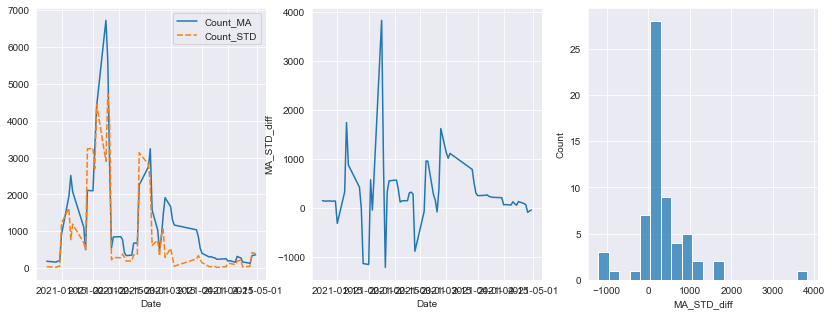

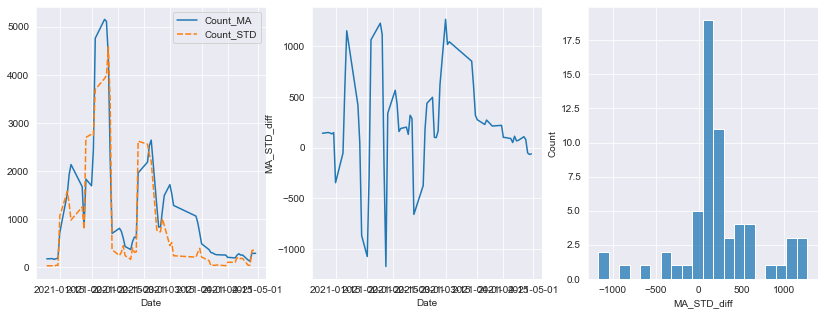

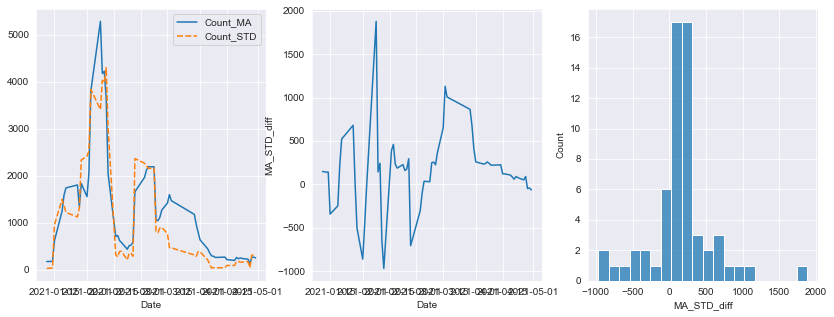

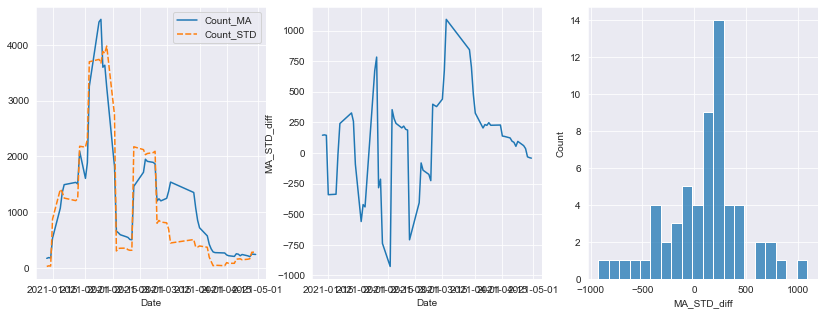

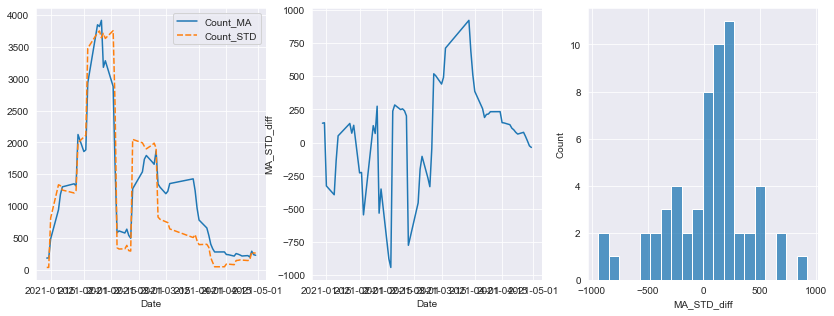

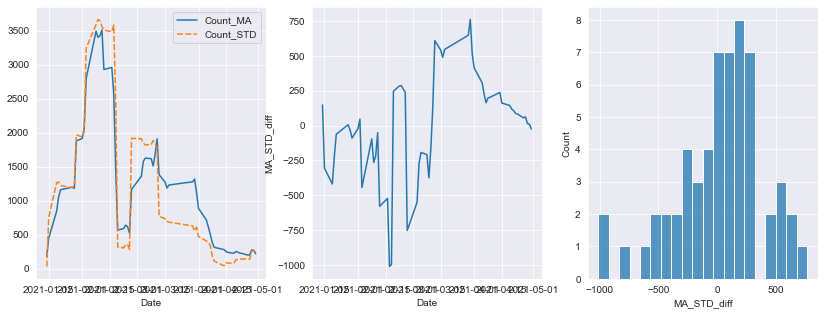

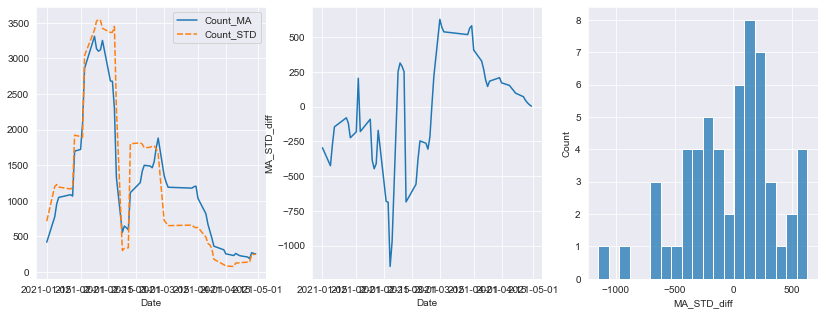

In [122]:
for w in range(3,10): 
    df = build_stock_df(ticker = 'GME', 
                   start = '2021-1-1', 
                   end = '2021-5-1')
    W = w

    df.loc[:,'Count_MA'] = df.loc[:,'Count'].shift(1).rolling(W).mean()
    df.loc[:,'Count_STD'] = df.loc[:,'Count'].shift(1).rolling(W).std(ddof = 1)
    df.loc[:,'MA_STD_diff'] = df.loc[:,'Count_MA'] - df.loc[:,'Count_STD']
#     print(df.tail(15))

    fig, axes = plt.subplots(1,3, sharex = False, figsize = [14,5])
    sns.set_style('darkgrid')
    sns.lineplot(ax = axes[0], data = df.loc[:,['Count_MA','Count_STD']])
    sns.lineplot(ax = axes[1], data = df.loc[:,'MA_STD_diff'])
#     sns.histplot(ax = axes[1], data = df.loc[:,'lCount'], bins = 20)
    sns.histplot(ax = axes[2], data = df.loc[:,'MA_STD_diff'], bins = 20)
    plt.show()

In [113]:
from scipy.stats import poisson 
a = 0.1
mu = 10
x = poisson.ppf(q = a , mu = mu)
print(1- x/mu)
y = poisson.ppf(q = 1-a , mu = mu)
print(1- y/mu)

0.4
-0.3999999999999999


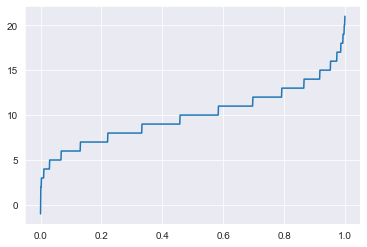

In [110]:
x = np.arange(0,1,0.001)
y = poisson.ppf(q = x, mu = 10)
plt.plot(x,y)

In [143]:
df = pd.DataFrame({'A':[1,2,3], 'B':[2,4,6]})
def add(a,b):
    return a+b
df.apply(lambda x : poisson.cdf(x.A, x.B), axis = 1)

0    0.406006
1    0.238103
2    0.151204
dtype: float64

In [26]:
df = pd.DataFrame({'A':[-1,-2]})
print(df)
df.diff()

   A
0 -1
1 -2


,A
0,NaN
1,-1.0


1
